## Imports

In [3]:
%matplotlib inline
import os, random, glob
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from IPython.display import display, HTML

print(f"TensorFlow {tf.__version__}")
print("GPUs available:", tf.config.list_physical_devices('GPU'))


2026-04-25 19:07:45.183968: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1777144065.442677      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1777144065.517309      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1777144066.078814      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777144066.078862      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777144066.078865      55 computation_placer.cc:177] computation placer alr

TensorFlow 2.19.0
GPUs available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


## Configuration

In [4]:
DATA_ROOT  = '/kaggle/input/datasets/andrewmvd/medical-mnist'
MODELS_DIR = '/kaggle/working/dsai490/models'
OUTPUT_DIR = '/kaggle/working/dsai490/outputs'
IMAGE_SIZE = 64
LATENT_DIM = 64
EPOCHS     = 30
BATCH_SIZE = 32
SEED       = 42

os.makedirs(MODELS_DIR, exist_ok=True)
os.makedirs(OUTPUT_DIR, exist_ok=True)

def set_seeds(seed=SEED):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

set_seeds()
REGIONS = sorted([d for d in os.listdir(DATA_ROOT) if os.path.isdir(os.path.join(DATA_ROOT, d))])
print("Regions found:", REGIONS)


Regions found: ['AbdomenCT', 'BreastMRI', 'CXR', 'ChestCT', 'Hand', 'HeadCT']


## tf.data

In [ ]:
import os
import zipfile

DATASET_ZIP  = '/content/drive/MyDrive/dsai490/data/raw/archive.zip'
RAW_DATA_DIR = '/content/drive/MyDrive/dsai490/data/raw/MedicalMNIST'

if not os.path.isdir(RAW_DATA_DIR):
    print(f"Extracting dataset from {DATASET_ZIP} ...")
    with zipfile.ZipFile(DATASET_ZIP, 'r') as zf:
        zf.extractall(os.path.dirname(RAW_DATA_DIR))
    print("Extraction complete.")
else:
    print(f"Dataset already extracted at: {RAW_DATA_DIR}")

In [5]:
def _load_and_preprocess(path, image_size):
    raw = tf.io.read_file(path)
    img = tf.image.decode_image(raw, channels=1, expand_animations=False)
    img = tf.image.resize(img, [image_size, image_size])
    img = tf.cast(img, tf.float32) / 255.0
    img.set_shape([image_size, image_size, 1])
    return img

def build_dataset(region, data_root=DATA_ROOT, image_size=IMAGE_SIZE,
                  batch_size=BATCH_SIZE, val_split=0.15, shuffle_buf=1000, seed=SEED):
    region_dir = os.path.join(data_root, region)
    if not os.path.isdir(region_dir):
        raise FileNotFoundError(f"Region folder not found: {region_dir}")
    all_files = []
    for ext in ['*.png','*.jpg','*.jpeg','*.PNG','*.JPG','*.JPEG']:
        all_files.extend(glob.glob(os.path.join(region_dir, ext)))
    paths = sorted(set(all_files))
    if not paths:
        raise FileNotFoundError(f"No images found in {region_dir}")
    print(f"{region}: {len(paths)} images found")
    rng = np.random.default_rng(seed)
    shuffled = rng.permutation(len(paths))
    n_val = max(1, int(len(paths) * val_split))
    val_paths = [paths[i] for i in shuffled[:n_val]]
    trn_paths = [paths[i] for i in shuffled[n_val:]]
    def make(path_list, do_shuffle):
        ds = tf.data.Dataset.from_tensor_slices(path_list)
        ds = ds.map(lambda p: _load_and_preprocess(p, image_size),
                    num_parallel_calls=tf.data.AUTOTUNE)
        if do_shuffle:
            ds = ds.shuffle(shuffle_buf, seed=seed, reshuffle_each_iteration=True)
        return ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return make(trn_paths, True), make(val_paths, False)

print("pipeline.py ready")


pipeline.py ready


## Deterministic Autoencoder

In [6]:
def ae_encoder(image_size=IMAGE_SIZE, latent_dim=LATENT_DIM):
    inp = keras.Input(shape=(image_size, image_size, 1))
    x = layers.Conv2D(32,  3, strides=2, padding='same', activation='relu')(inp)
    x = layers.Conv2D(64,  3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(128, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Flatten()(x)
    z = layers.Dense(latent_dim, name='latent')(x)
    return keras.Model(inp, z, name='ae_encoder')

def ae_decoder(image_size=IMAGE_SIZE, latent_dim=LATENT_DIM):
    h = image_size // 8
    inp = keras.Input(shape=(latent_dim,))
    x = layers.Dense(h * h * 128, activation='relu')(inp)
    x = layers.Reshape((h, h, 128))(x)
    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(64,  3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(32,  3, strides=2, padding='same', activation='relu')(x)
    out = layers.Conv2D(1, 3, padding='same', activation='sigmoid', name='reconstruction')(x)
    return keras.Model(inp, out, name='ae_decoder')

class Autoencoder(keras.Model):
    def __init__(self, image_size=IMAGE_SIZE, latent_dim=LATENT_DIM, **kw):
        super().__init__(**kw)
        self.encoder = ae_encoder(image_size, latent_dim)
        self.decoder = ae_decoder(image_size, latent_dim)
        self.loss_tracker = keras.metrics.Mean(name='loss')
    @property
    def metrics(self): return [self.loss_tracker]
    def call(self, x, training=False):
        return self.decoder(self.encoder(x, training=training), training=training)
    def train_step(self, x):
        with tf.GradientTape() as tape:
            loss = tf.reduce_mean(tf.square(x - self(x, training=True)))
        self.optimizer.apply_gradients(
            zip(tape.gradient(loss, self.trainable_variables), self.trainable_variables))
        self.loss_tracker.update_state(loss)
        return {'loss': self.loss_tracker.result()}
    def test_step(self, x):
        loss = tf.reduce_mean(tf.square(x - self(x, training=False)))
        self.loss_tracker.update_state(loss)
        return {'loss': self.loss_tracker.result()}

print("autoencoder.py ready")


autoencoder.py ready


## vae — Variational Autoencoder

In [7]:
class Sampling(layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        eps = tf.random.normal(shape=tf.shape(z_mean))
        return z_mean + eps * tf.exp(0.5 * z_log_var)

def vae_encoder(image_size=IMAGE_SIZE, latent_dim=LATENT_DIM):
    inp = keras.Input(shape=(image_size, image_size, 1))
    x = layers.Conv2D(32,  3, strides=2, padding='same', activation='relu')(inp)
    x = layers.Conv2D(64,  3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(128, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Flatten()(x)
    z_mean    = layers.Dense(latent_dim, name='z_mean')(x)
    z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
    z         = Sampling(name='z_sample')([z_mean, z_log_var])
    return keras.Model(inp, [z_mean, z_log_var, z], name='vae_encoder')

def vae_decoder(image_size=IMAGE_SIZE, latent_dim=LATENT_DIM):
    h = image_size // 8
    inp = keras.Input(shape=(latent_dim,))
    x = layers.Dense(h * h * 128, activation='relu')(inp)
    x = layers.Reshape((h, h, 128))(x)
    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(64,  3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(32,  3, strides=2, padding='same', activation='relu')(x)
    out = layers.Conv2D(1, 3, padding='same', activation='sigmoid', name='vae_recon')(x)
    return keras.Model(inp, out, name='vae_decoder')

class VAE(keras.Model):
    def __init__(self, image_size=IMAGE_SIZE, latent_dim=LATENT_DIM, beta=1.0, **kw):
        super().__init__(**kw)
        self.encoder    = vae_encoder(image_size, latent_dim)
        self.decoder    = vae_decoder(image_size, latent_dim)
        self.beta       = beta
        self.latent_dim = latent_dim
        self.total  = keras.metrics.Mean(name='total_loss')
        self.recon  = keras.metrics.Mean(name='recon_loss')
        self.kl     = keras.metrics.Mean(name='kl_loss')
    @property
    def metrics(self): return [self.total, self.recon, self.kl]
    def call(self, x, training=False):
        z_mean, z_log_var, z = self.encoder(x, training=training)
        return self.decoder(z, training=training), z_mean, z_log_var
    def _loss(self, x, training):
        z_mean, z_log_var, z = self.encoder(x, training=training)
        xhat = self.decoder(z, training=training)
        recon = tf.reduce_mean(tf.reduce_sum(tf.square(x - xhat), axis=[1,2,3]))
        kl    = -0.5 * tf.reduce_mean(
                    tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1))
        return recon + self.beta * kl, recon, kl
    def train_step(self, x):
        with tf.GradientTape() as tape:
            total, recon, kl = self._loss(x, training=True)
        self.optimizer.apply_gradients(
            zip(tape.gradient(total, self.trainable_variables), self.trainable_variables))
        self.total.update_state(total); self.recon.update_state(recon); self.kl.update_state(kl)
        return {m.name: m.result() for m in self.metrics}
    def test_step(self, x):
        total, recon, kl = self._loss(x, training=False)
        self.total.update_state(total); self.recon.update_state(recon); self.kl.update_state(kl)
        return {m.name: m.result() for m in self.metrics}
    def sample(self, n=16):
        z = tf.random.normal(shape=(n, self.latent_dim))
        return self.decoder(z, training=False)

print("vae.py ready")


vae.py ready


## Training 

In [8]:
def train_ae(region, train_ds, val_ds, latent_dim=LATENT_DIM,
             epochs=EPOCHS, lr=1e-3, models_dir=MODELS_DIR, seed=SEED):
    set_seeds(seed)
    ae = Autoencoder(image_size=IMAGE_SIZE, latent_dim=latent_dim)
    ae.compile(optimizer=keras.optimizers.Adam(lr))
    for b in train_ds.take(1): ae(b)
    ckpt = os.path.join(models_dir, f'ae_{region}_best.keras')
    cbs = [
        keras.callbacks.ModelCheckpoint(ckpt, monitor='val_loss', mode='min',
                                        save_best_only=True, verbose=0),
        keras.callbacks.EarlyStopping(monitor='val_loss', mode='min',
                                      patience=5, restore_best_weights=True, verbose=1),
        keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min',
                                          factor=0.5, patience=3, verbose=1),
    ]
    hist = ae.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=cbs, verbose=1)
    return ae, hist.history

def train_vae(region, train_ds, val_ds, latent_dim=LATENT_DIM,
              epochs=EPOCHS, lr=1e-3, beta=1.0, models_dir=MODELS_DIR, seed=SEED):
    set_seeds(seed)
    vae = VAE(image_size=IMAGE_SIZE, latent_dim=latent_dim, beta=beta)
    vae.compile(optimizer=keras.optimizers.Adam(lr))
    for b in train_ds.take(1): vae(b)
    ckpt = os.path.join(models_dir, f'vae_{region}_best.keras')
    cbs = [
        keras.callbacks.ModelCheckpoint(ckpt, monitor='val_total_loss', mode='min',
                                        save_best_only=True, verbose=0),
        keras.callbacks.EarlyStopping(monitor='val_total_loss', mode='min',
                                      patience=5, restore_best_weights=True, verbose=1),
        keras.callbacks.ReduceLROnPlateau(monitor='val_total_loss', mode='min',
                                          factor=0.5, patience=3, verbose=1),
    ]
    hist = vae.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=cbs, verbose=1)
    return vae, hist.history

print("trainer.py ready")


trainer.py ready


## Visualization Functions

In [9]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# ── Helpers ──────────────────────────────────────────────────────────────────
def _save(fig, fname, region, out_dir=OUTPUT_DIR):
    rdir = os.path.join(out_dir, region)
    os.makedirs(rdir, exist_ok=True)
    fig.savefig(os.path.join(rdir, fname), bbox_inches='tight', dpi=130)
    plt.show()
    plt.close(fig)

# ── Loss Curves ───────────────────────────────────────────────────────────────
def plot_ae_loss(ae_hist, region):
    fig, ax = plt.subplots(figsize=(7, 4))
    ax.plot(ae_hist['loss'],     label='train loss')
    ax.plot(ae_hist['val_loss'], label='val loss', linestyle='--')
    ax.set_title(f'AE Loss Curves — {region}')
    ax.set_xlabel('Epoch'); ax.set_ylabel('MSE')
    ax.legend(); ax.grid(alpha=0.3)
    plt.tight_layout()
    _save(fig, 'ae_loss_curves.png', region)

def plot_vae_loss(vae_hist, region):
    fig, ax = plt.subplots(figsize=(7, 4))
    ax.plot(vae_hist['total_loss'],     label='train total')
    ax.plot(vae_hist['val_total_loss'], label='val total',  linestyle='--')
    ax.plot(vae_hist['recon_loss'],     label='recon',      linestyle=':')
    ax.plot(vae_hist['kl_loss'],        label='KL',         linestyle='-.')
    ax.set_title(f'VAE Loss Curves — {region}')
    ax.set_xlabel('Epoch'); ax.set_ylabel('Loss')
    ax.legend(); ax.grid(alpha=0.3)
    plt.tight_layout()
    _save(fig, 'vae_loss_curves.png', region)

# ── Reconstructions ───────────────────────────────────────────────────────────
def plot_reconstructions(model, ds, model_name, region, n=8):
    for batch in ds.take(1): imgs = batch[:n]
    recons = model(imgs, training=False)
    if isinstance(model, VAE): recons = recons[0]
    fig, axes = plt.subplots(2, n, figsize=(n*1.6, 3.2))
    for i in range(n):
        axes[0,i].imshow(imgs[i,...,0].numpy(),   cmap='gray', vmin=0, vmax=1); axes[0,i].axis('off')
        axes[1,i].imshow(recons[i,...,0].numpy(), cmap='gray', vmin=0, vmax=1); axes[1,i].axis('off')
    axes[0,0].set_ylabel('Original',      fontsize=9)
    axes[1,0].set_ylabel('Reconstructed', fontsize=9)
    fig.suptitle(f'{model_name} Reconstructions — {region}', fontsize=11, y=1.01)
    plt.tight_layout()
    _save(fig, f'{model_name.lower()}_reconstructions.png', region)

# ── Latent Space (latent_dim=2 native) ────────────────────────────────────────
def plot_latent_space(vae, ds, region, n_batches=15):
    z_all = np.concatenate(
        [vae.encoder(b, training=False)[0].numpy()
         for i, b in enumerate(ds) if i < n_batches], axis=0)
    if z_all.shape[1] != 2:
        print(f"latent_dim={z_all.shape[1]} — skipping native 2-D scatter")
        return
    fig, ax = plt.subplots(figsize=(6, 5))
    ax.scatter(z_all[:,0], z_all[:,1], s=7, alpha=0.45, c='steelblue')
    ax.set_title(f'VAE Latent Space 2-D (native) — {region}')
    ax.set_xlabel('z0'); ax.set_ylabel('z1')
    ax.grid(alpha=0.3); plt.tight_layout()
    _save(fig, 'vae_latent_space_native2d.png', region)

# ── Generation ────────────────────────────────────────────────────────────────
def plot_generated(vae, region, n=16):
    imgs = vae.sample(n).numpy()
    cols, rows = 8, (n + 7) // 8
    fig, axes = plt.subplots(rows, cols, figsize=(cols*1.5, rows*1.6))
    for i, ax in enumerate(np.array(axes).reshape(-1)):
        if i < n: ax.imshow(imgs[i,...,0], cmap='gray', vmin=0, vmax=1)
        ax.axis('off')
    fig.suptitle(f'VAE Generated Samples — {region}', fontsize=11)
    plt.tight_layout()
    _save(fig, 'vae_generated.png', region)

# ── Denoising ─────────────────────────────────────────────────────────────────
def plot_denoising(model, ds, model_name, region, noise_std=0.3, n=8):
    for batch in ds.take(1): clean = batch[:n]
    noisy    = tf.clip_by_value(clean + tf.random.normal(clean.shape, stddev=noise_std), 0, 1)
    denoised = model(noisy, training=False)
    if isinstance(model, VAE): denoised = denoised[0]
    fig, axes = plt.subplots(3, n, figsize=(n*1.6, 4.8))
    for i in range(n):
        axes[0,i].imshow(clean[i,...,0].numpy(),    cmap='gray', vmin=0, vmax=1); axes[0,i].axis('off')
        axes[1,i].imshow(noisy[i,...,0].numpy(),    cmap='gray', vmin=0, vmax=1); axes[1,i].axis('off')
        axes[2,i].imshow(denoised[i,...,0].numpy(), cmap='gray', vmin=0, vmax=1); axes[2,i].axis('off')
    for r, lbl in enumerate(['Clean', 'Noisy', 'Denoised']): axes[r,0].set_ylabel(lbl, fontsize=9)
    fig.suptitle(f'{model_name} Denoising — {region}', fontsize=11, y=1.01)
    plt.tight_layout()
    _save(fig, f'{model_name.lower()}_denoising.png', region)

# ── Latent Extraction Helpers ─────────────────────────────────────────────────
def get_ae_latents(ae, ds, n_batches=15):
    return np.concatenate(
        [ae.encoder(b, training=False).numpy()
         for i, b in enumerate(ds) if i < n_batches], axis=0)

def get_vae_latents(vae, ds, n_batches=15):
    return np.concatenate(
        [vae.encoder(b, training=False)[0].numpy()
         for i, b in enumerate(ds) if i < n_batches], axis=0)

# ── 2D / 3D Latent Space Visualizations ──────────────────────────────────────
def plot_pca_2d(z, model_name, region):
    coords = PCA(n_components=2).fit_transform(z)
    fig, ax = plt.subplots(figsize=(6, 5))
    ax.scatter(coords[:,0], coords[:,1], s=7, alpha=0.45, c='steelblue')
    ax.set_title(f'{model_name} Latent Space — PCA 2D — {region}')
    ax.set_xlabel('PC1'); ax.set_ylabel('PC2')
    ax.grid(alpha=0.3); plt.tight_layout()
    _save(fig, f'{model_name.lower()}_pca2d.png', region)

def plot_tsne_2d(z, model_name, region):
    coords = TSNE(n_components=2, random_state=SEED, perplexity=30).fit_transform(z)
    fig, ax = plt.subplots(figsize=(6, 5))
    ax.scatter(coords[:,0], coords[:,1], s=7, alpha=0.45, c='tomato')
    ax.set_title(f'{model_name} Latent Space — t-SNE 2D — {region}')
    ax.set_xlabel('Dim 1'); ax.set_ylabel('Dim 2')
    ax.grid(alpha=0.3); plt.tight_layout()
    _save(fig, f'{model_name.lower()}_tsne2d.png', region)

def plot_pca_3d(z, model_name, region):
    coords = PCA(n_components=3).fit_transform(z)
    fig = plt.figure(figsize=(7, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(coords[:,0], coords[:,1], coords[:,2], s=5, alpha=0.4, c='mediumseagreen')
    ax.set_title(f'{model_name} Latent Space — PCA 3D — {region}')
    ax.set_xlabel('PC1'); ax.set_ylabel('PC2'); ax.set_zlabel('PC3')
    plt.tight_layout()
    _save(fig, f'{model_name.lower()}_pca3d.png', region)

print("visualize.py ready ✓")

visualize.py ready ✓


---
## Region: AbdomenCT


### AbdomenCT

In [10]:
train_ds_AbdomenCT, val_ds_AbdomenCT = build_dataset('AbdomenCT')

AbdomenCT: 10000 images found


I0000 00:00:1777144094.571433      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1777144094.577475      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


### AbdomenCT — Autoencoder (AE)

In [11]:
ae_AbdomenCT, ae_hist_AbdomenCT = train_ae('AbdomenCT', train_ds_AbdomenCT, val_ds_AbdomenCT)

I0000 00:00:1777144099.552733      55 cuda_dnn.cc:529] Loaded cuDNN version 91002


Epoch 1/30


I0000 00:00:1777144103.861600     157 service.cc:152] XLA service 0x7ee898006700 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1777144103.861639     157 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1777144103.861644     157 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  4/266 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.0137

I0000 00:00:1777144107.444054     157 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


266/266 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0087 - val_loss: 0.0045 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0039 - val_loss: 0.0029 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0026 - val_loss: 0.0022 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.0020 - val_loss: 0.0018 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0017 - val_loss: 0.0016 - learning_rate: 0.0010
Epoch 6/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.0015 - val_loss: 0.0014 - learning_rate: 0.0010
Epoch 7/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0013 - val_loss: 0.0014 - learning_rate: 0.0010
Epoch 8/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0012 - val_loss: 0.0013 - learning_rate: 0.0010
Epoch 9/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0011 - val_loss: 0.0012 - learning_rate: 0.0010
Epoch 10/30

#### AbdomenCT — AE Loss Curves

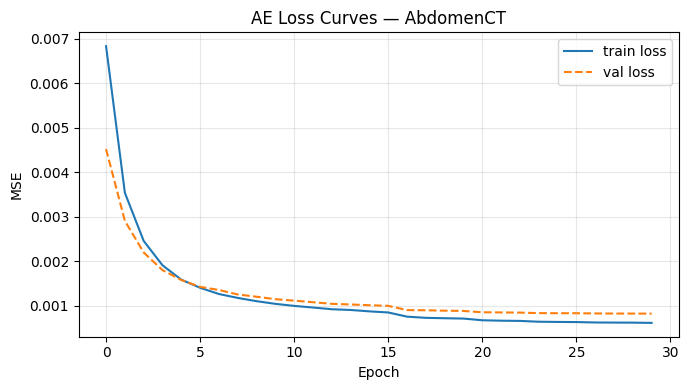

In [12]:
plot_ae_loss(ae_hist_AbdomenCT, 'AbdomenCT')

#### AbdomenCT — AE Reconstructions

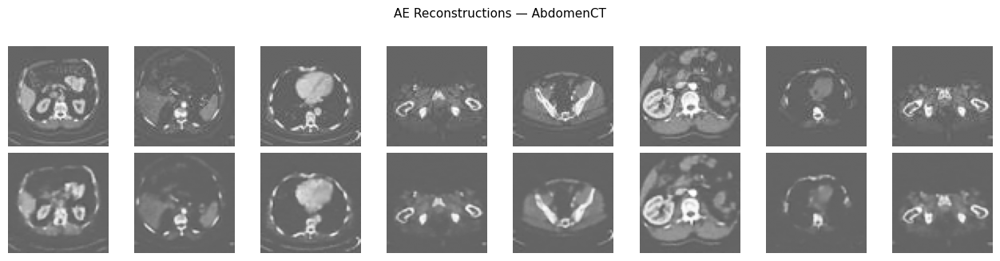

In [13]:
plot_reconstructions(ae_AbdomenCT, val_ds_AbdomenCT, 'AE', 'AbdomenCT')

#### AbdomenCT — AE Denoising

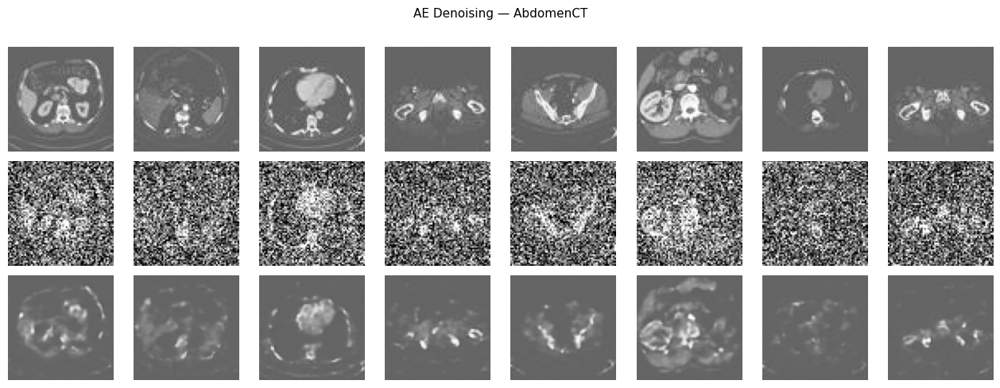

In [14]:
plot_denoising(ae_AbdomenCT, val_ds_AbdomenCT, 'AE', 'AbdomenCT')

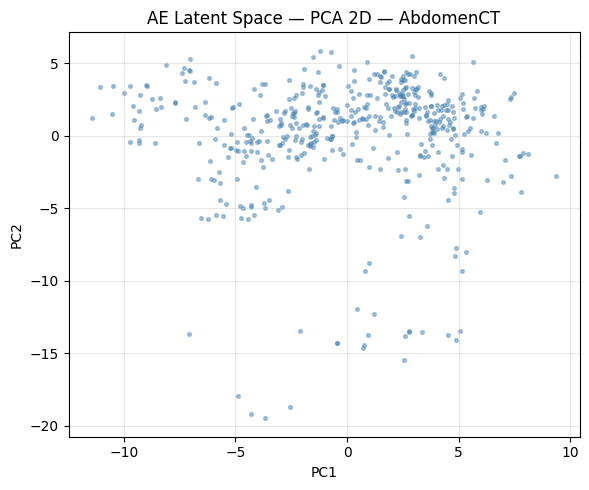

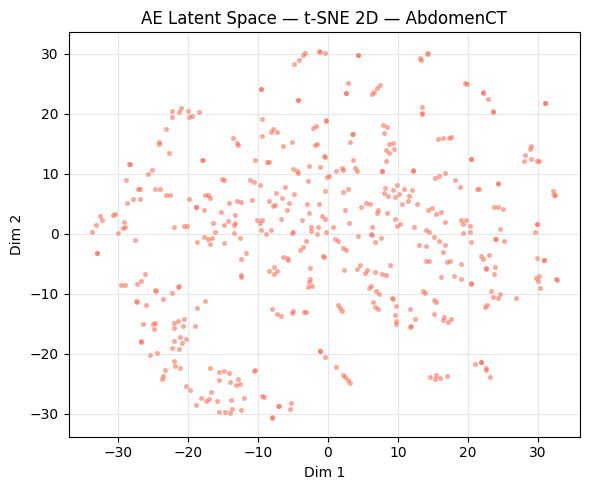

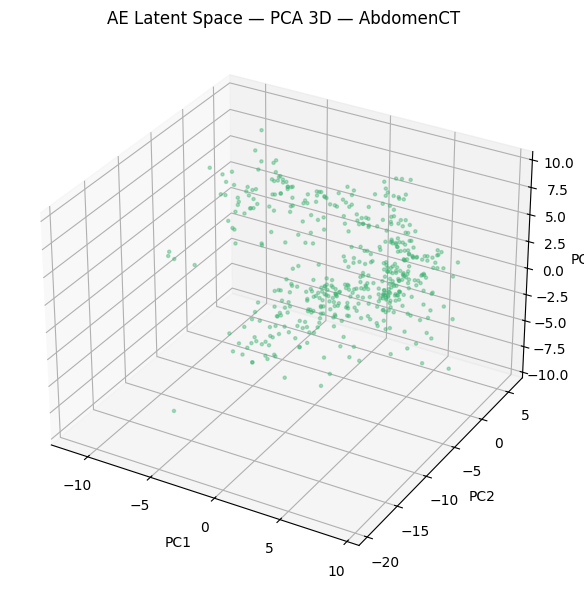

In [15]:
# AE — 2D/3D Latent Space
z_ae_AbdomenCT = get_ae_latents(ae_AbdomenCT, val_ds_AbdomenCT)
plot_pca_2d(z_ae_AbdomenCT,  'AE', 'AbdomenCT')
plot_tsne_2d(z_ae_AbdomenCT, 'AE', 'AbdomenCT')
plot_pca_3d(z_ae_AbdomenCT,  'AE', 'AbdomenCT')

### AbdomenCT — Variational Autoencoder (VAE)

In [16]:
train_ds_AbdomenCT, val_ds_AbdomenCT = build_dataset('AbdomenCT')
vae_AbdomenCT, vae_hist_AbdomenCT = train_vae('AbdomenCT', train_ds_AbdomenCT, val_ds_AbdomenCT)

AbdomenCT: 10000 images found
Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - kl_loss: 0.1793 - recon_loss: 38.1461 - total_loss: 38.3254 - val_kl_loss: 0.5326 - val_recon_loss: 33.6091 - val_total_loss: 34.1417 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - kl_loss: 0.6646 - recon_loss: 32.3616 - total_loss: 33.0261 - val_kl_loss: 0.9927 - val_recon_loss: 31.9485 - val_total_loss: 32.9412 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 1.4094 - recon_loss: 30.1081 - total_loss: 31.5175 - val_kl_loss: 1.8019 - val_recon_loss: 28.3376 - val_total_loss: 30.1395 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 2.9275 - recon_loss: 25.9791 - total_loss: 28.9066 - val_kl_loss: 3.8890 - val_recon_loss: 25.0798 - val_total_loss: 28.9688 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - kl_loss: 3.4043 - recon_loss: 24.8465 - total_loss: 28.2508 - 

#### AbdomenCT — VAE Loss Curves

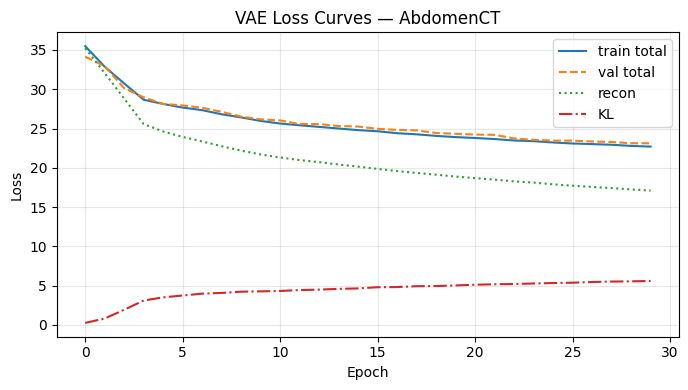

In [17]:
plot_vae_loss(vae_hist_AbdomenCT, 'AbdomenCT')

#### AbdomenCT — VAE Reconstructions

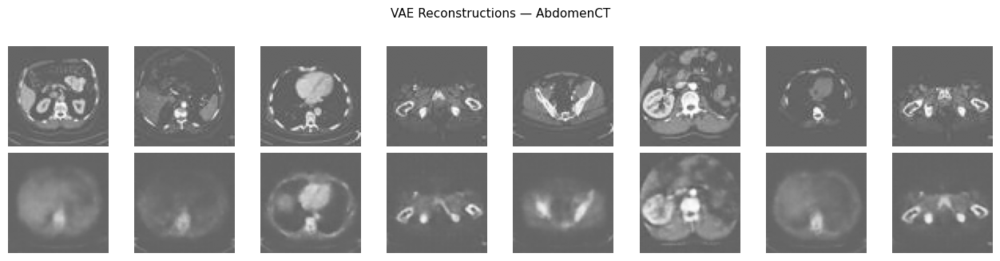

In [18]:
plot_reconstructions(vae_AbdomenCT, val_ds_AbdomenCT, 'VAE', 'AbdomenCT')

#### AbdomenCT — VAE Latent Space (latent_dim=2)

AbdomenCT: 10000 images found
Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - kl_loss: 0.0396 - recon_loss: 38.0870 - total_loss: 38.1266 - val_kl_loss: 0.0019 - val_recon_loss: 34.4718 - val_total_loss: 34.4737 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 0.0580 - recon_loss: 33.2056 - total_loss: 33.2636 - val_kl_loss: 0.8076 - val_recon_loss: 31.7739 - val_total_loss: 32.5815 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 1.5229 - recon_loss: 28.0194 - total_loss: 29.5423 - val_kl_loss: 1.8172 - val_recon_loss: 26.6163 - val_total_loss: 28.4335 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 2.0720 - recon_loss: 25.5245 - total_loss: 27.5965 - val_kl_loss: 1.9819 - val_recon_loss: 25.8153 - val_total_loss: 27.7972 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 2.2210 - recon_loss: 24.9693 - total_loss: 27.1903 - 

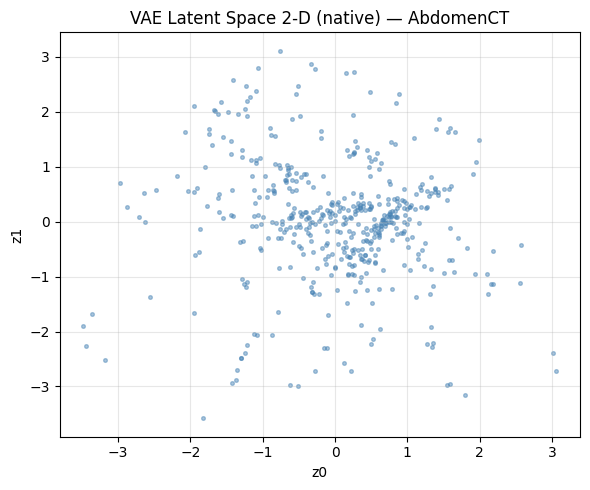

In [19]:
train_ds_AbdomenCT_2d, val_ds_AbdomenCT_2d = build_dataset('AbdomenCT')
vae_AbdomenCT_2d, _ = train_vae('AbdomenCT_2D', train_ds_AbdomenCT_2d, val_ds_AbdomenCT_2d, latent_dim=2)
plot_latent_space(vae_AbdomenCT_2d, val_ds_AbdomenCT_2d, 'AbdomenCT')

#### AbdomenCT — VAE Generated Samples

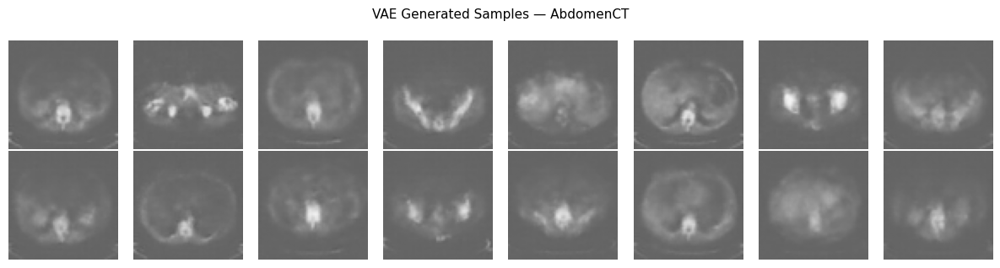

In [20]:
plot_generated(vae_AbdomenCT, 'AbdomenCT')

#### AbdomenCT — VAE Denoising

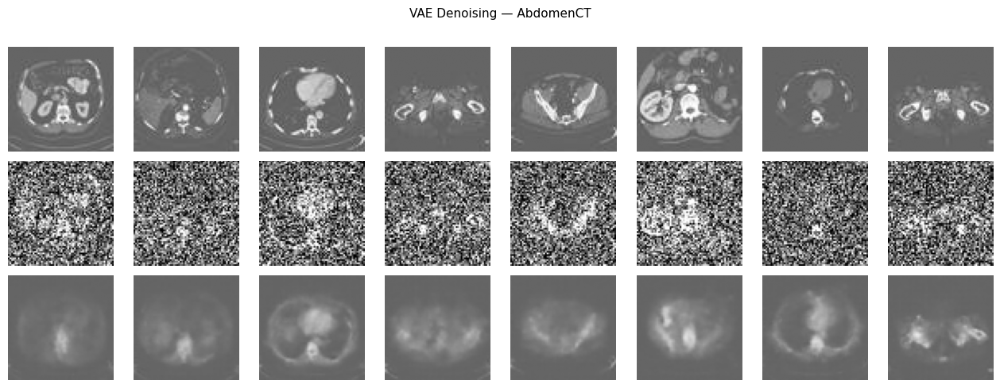

In [21]:
plot_denoising(vae_AbdomenCT, val_ds_AbdomenCT, 'VAE', 'AbdomenCT')

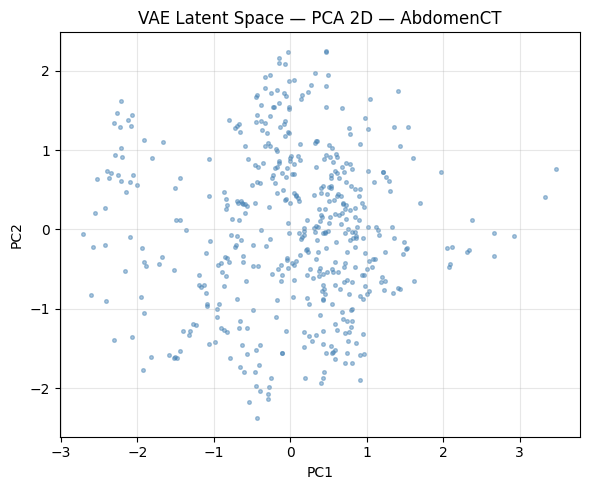

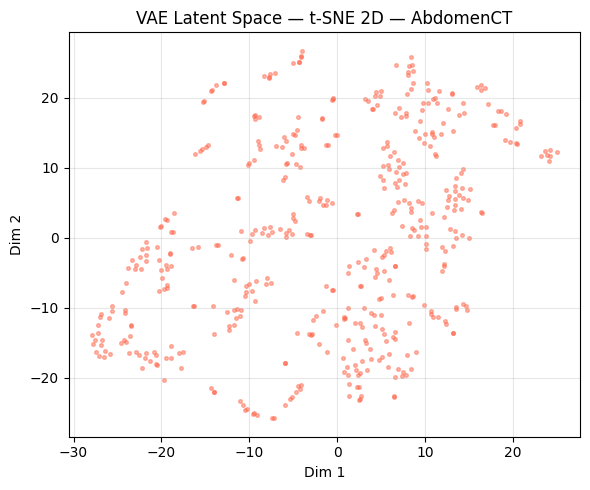

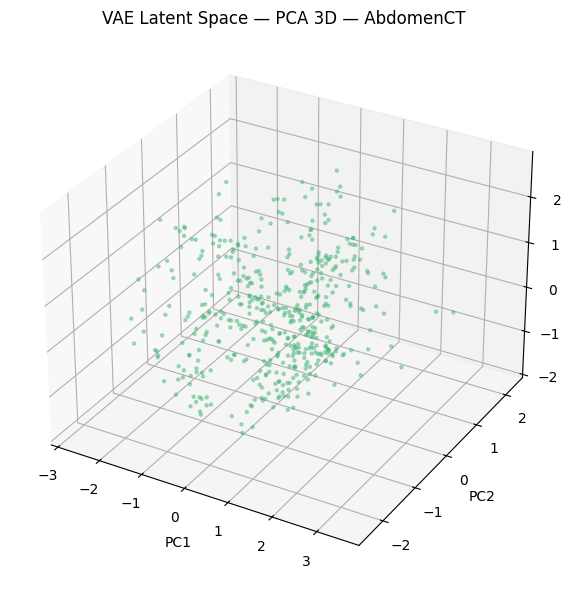

In [22]:
# VAE — 2D/3D Latent Space
z_vae_AbdomenCT = get_vae_latents(vae_AbdomenCT, val_ds_AbdomenCT)
plot_pca_2d(z_vae_AbdomenCT,  'VAE', 'AbdomenCT')
plot_tsne_2d(z_vae_AbdomenCT, 'VAE', 'AbdomenCT')
plot_pca_3d(z_vae_AbdomenCT,  'VAE', 'AbdomenCT')

---
## Region: BreastMRI
All cells below train and evaluate independent AE and VAE models using only `BreastMRI` images.

### BreastMRI — Data Pipeline

In [23]:
train_ds_BreastMRI, val_ds_BreastMRI = build_dataset('BreastMRI')

BreastMRI: 8954 images found


### BreastMRI — Autoencoder (AE)

In [24]:
ae_BreastMRI, ae_hist_BreastMRI = train_ae('BreastMRI', train_ds_BreastMRI, val_ds_BreastMRI)

Epoch 1/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.0752 - val_loss: 0.0157 - learning_rate: 0.0010
Epoch 2/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0135 - val_loss: 0.0085 - learning_rate: 0.0010
Epoch 3/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0078 - val_loss: 0.0060 - learning_rate: 0.0010
Epoch 4/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0057 - val_loss: 0.0050 - learning_rate: 0.0010
Epoch 5/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0047 - val_loss: 0.0042 - learning_rate: 0.0010
Epoch 6/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0040 - val_loss: 0.0036 - learning_rate: 0.0010
Epoch 7/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0035 - val_loss: 0.0036 - learning_rate: 0.0010
Epoch 8/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0032 - val_loss: 0.0031 - learning_rate: 0.0010
Epoch 9/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0029 - val_loss: 0.0029 - learning_rate: 0.0010


#### BreastMRI — AE Loss Curves

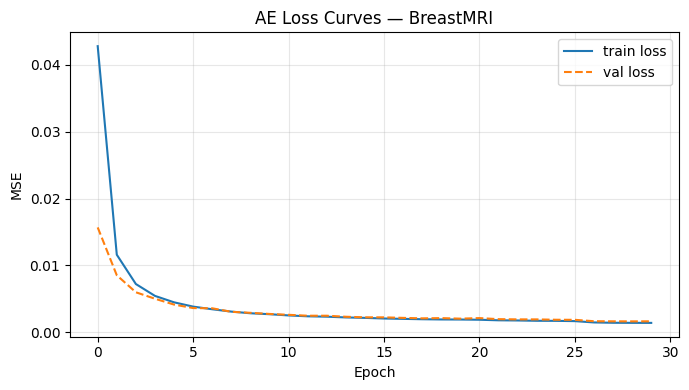

In [25]:
plot_ae_loss(ae_hist_BreastMRI, 'BreastMRI')

#### BreastMRI — AE Reconstructions

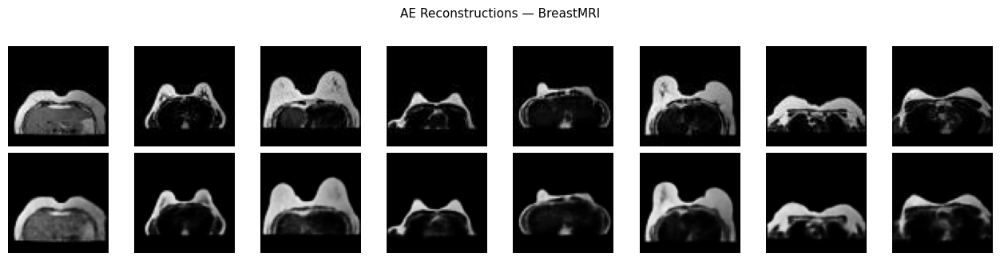

In [26]:
plot_reconstructions(ae_BreastMRI, val_ds_BreastMRI, 'AE', 'BreastMRI')

#### BreastMRI — AE Denoising

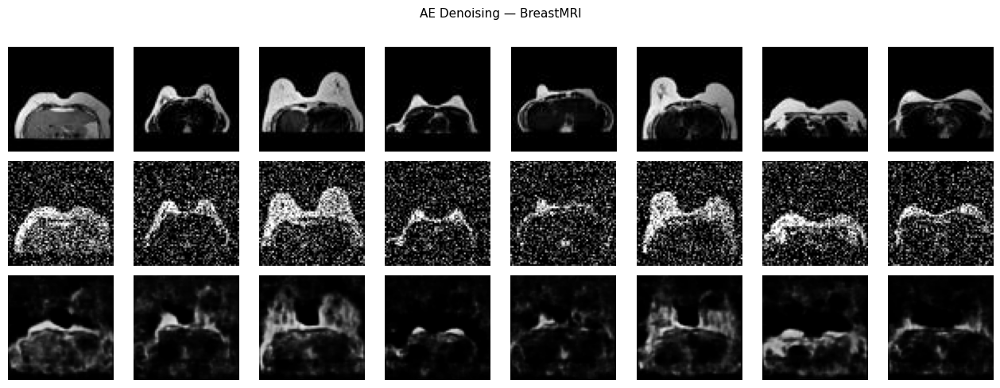

In [27]:
plot_denoising(ae_BreastMRI, val_ds_BreastMRI, 'AE', 'BreastMRI')

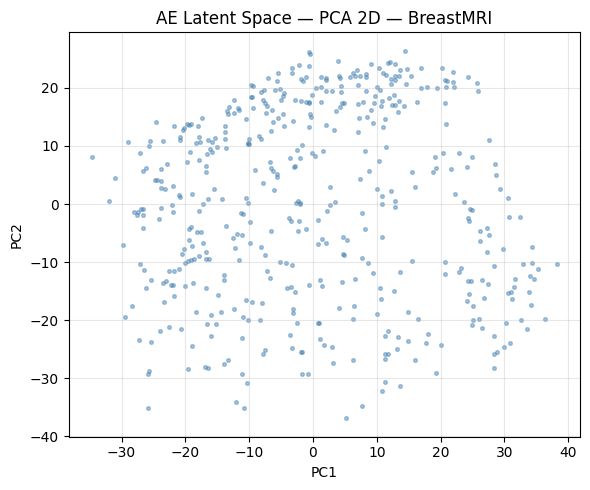

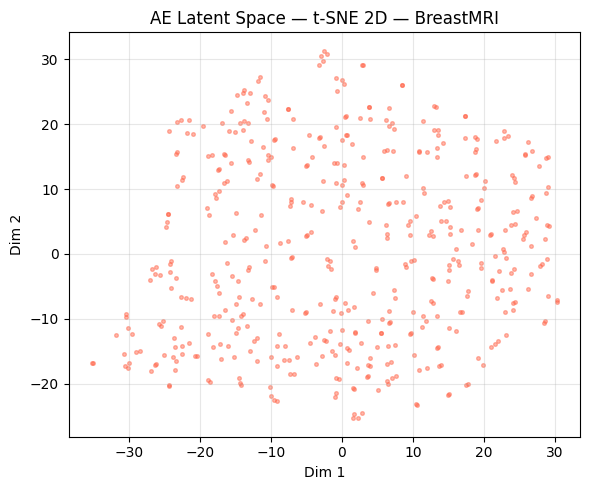

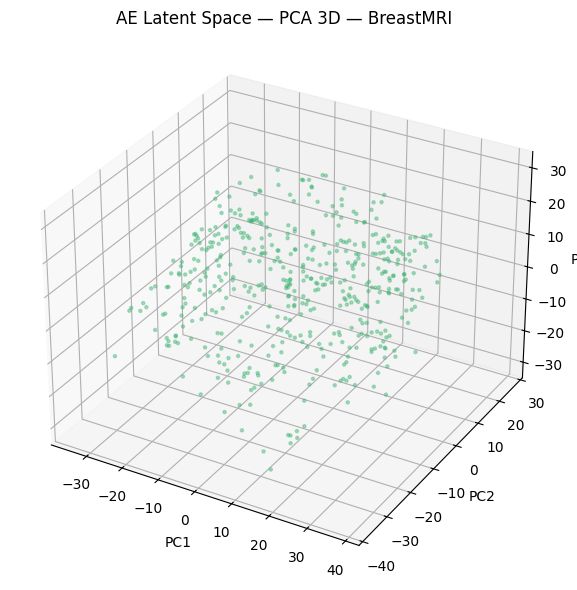

In [28]:
z_ae_BreastMRI = get_ae_latents(ae_BreastMRI, val_ds_BreastMRI)
plot_pca_2d(z_ae_BreastMRI,  'AE', 'BreastMRI')
plot_tsne_2d(z_ae_BreastMRI, 'AE', 'BreastMRI')
plot_pca_3d(z_ae_BreastMRI,  'AE', 'BreastMRI')

### BreastMRI — Variational Autoencoder (VAE)

In [29]:
train_ds_BreastMRI, val_ds_BreastMRI = build_dataset('BreastMRI')
vae_BreastMRI, vae_hist_BreastMRI = train_vae('BreastMRI', train_ds_BreastMRI, val_ds_BreastMRI)

BreastMRI: 8954 images found
Epoch 1/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - kl_loss: 9.0035 - recon_loss: 216.3733 - total_loss: 225.3768 - val_kl_loss: 10.8106 - val_recon_loss: 79.6674 - val_total_loss: 90.4780 - learning_rate: 0.0010
Epoch 2/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 10.3248 - recon_loss: 76.5310 - total_loss: 86.8558 - val_kl_loss: 12.2405 - val_recon_loss: 63.7272 - val_total_loss: 75.9677 - learning_rate: 0.0010
Epoch 3/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 12.7140 - recon_loss: 59.7605 - total_loss: 72.4745 - val_kl_loss: 14.7064 - val_recon_loss: 51.9316 - val_total_loss: 66.6380 - learning_rate: 0.0010
Epoch 4/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - kl_loss: 14.2621 - recon_loss: 50.5129 - total_loss: 64.7751 - val_kl_loss: 15.9684 - val_recon_loss: 45.7317 - val_total_loss: 61.7001 - learning_rate: 0.0010
Epoch 5/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 15.3043 - recon_loss: 45.5702 - total_loss: 6

#### BreastMRI — VAE Loss Curves

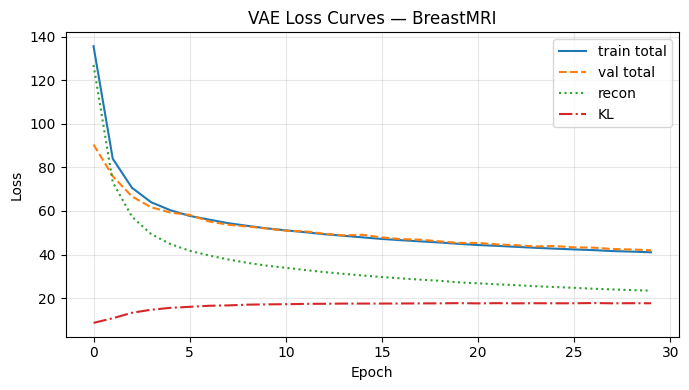

In [30]:
plot_vae_loss(vae_hist_BreastMRI, 'BreastMRI')

#### BreastMRI — VAE Reconstructions

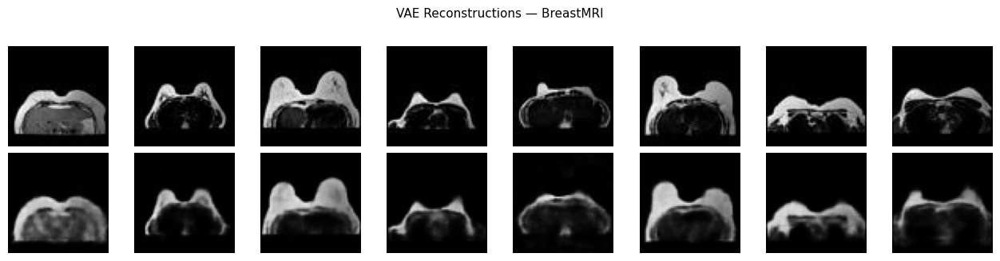

In [31]:
plot_reconstructions(vae_BreastMRI, val_ds_BreastMRI, 'VAE', 'BreastMRI')

#### BreastMRI — VAE Latent Space (latent_dim=2)

BreastMRI: 8954 images found
Epoch 1/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - kl_loss: 8.7603 - recon_loss: 255.7277 - total_loss: 264.4880 - val_kl_loss: 3.8419 - val_recon_loss: 88.6779 - val_total_loss: 92.5198 - learning_rate: 0.0010
Epoch 2/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.1752 - recon_loss: 81.7241 - total_loss: 85.8993 - val_kl_loss: 4.3236 - val_recon_loss: 74.9104 - val_total_loss: 79.2340 - learning_rate: 0.0010
Epoch 3/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.4758 - recon_loss: 72.8330 - total_loss: 77.3088 - val_kl_loss: 4.6415 - val_recon_loss: 72.1815 - val_total_loss: 76.8230 - learning_rate: 0.0010
Epoch 4/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.5771 - recon_loss: 71.1054 - total_loss: 75.6824 - val_kl_loss: 4.7229 - val_recon_loss: 71.4468 - val_total_loss: 76.1696 - learning_rate: 0.0010
Epoch 5/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.6652 - recon_loss: 70.1571 - total_loss: 74.8222 -

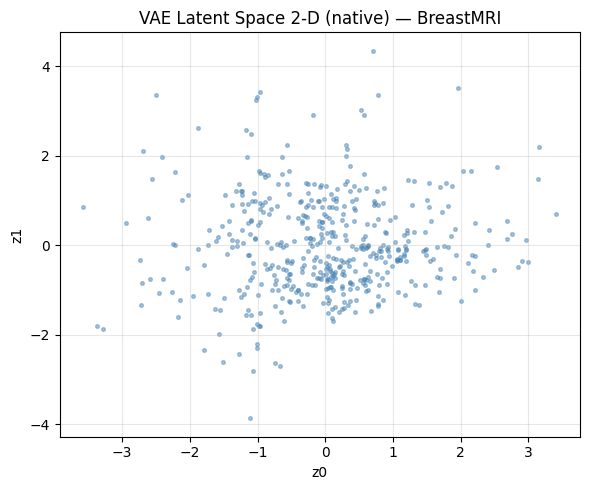

In [32]:
train_ds_BreastMRI_2d, val_ds_BreastMRI_2d = build_dataset('BreastMRI')
vae_BreastMRI_2d, _ = train_vae('BreastMRI_2D', train_ds_BreastMRI_2d, val_ds_BreastMRI_2d, latent_dim=2)
plot_latent_space(vae_BreastMRI_2d, val_ds_BreastMRI_2d, 'BreastMRI')

#### BreastMRI — VAE Generated Samples

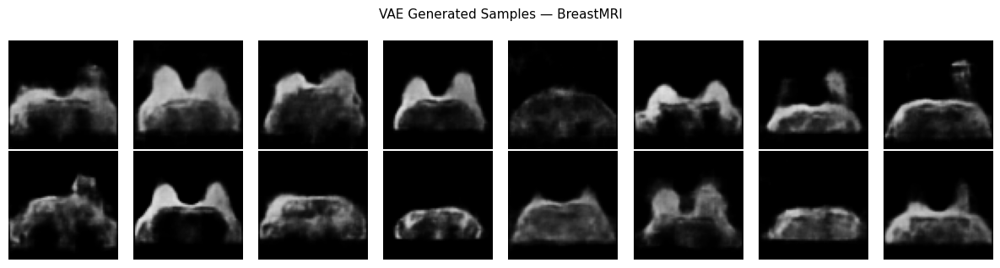

In [33]:
plot_generated(vae_BreastMRI, 'BreastMRI')

#### BreastMRI — VAE Denoising

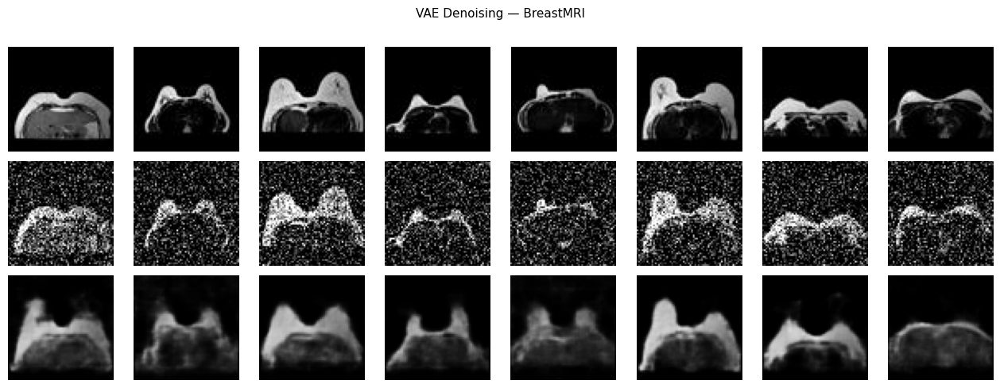

In [34]:
plot_denoising(vae_BreastMRI, val_ds_BreastMRI, 'VAE', 'BreastMRI')

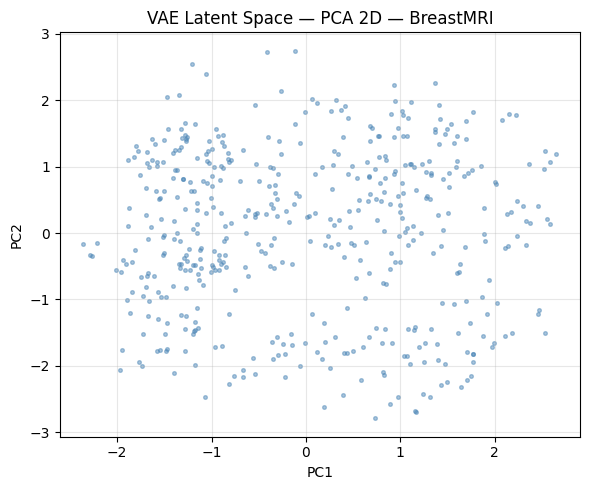

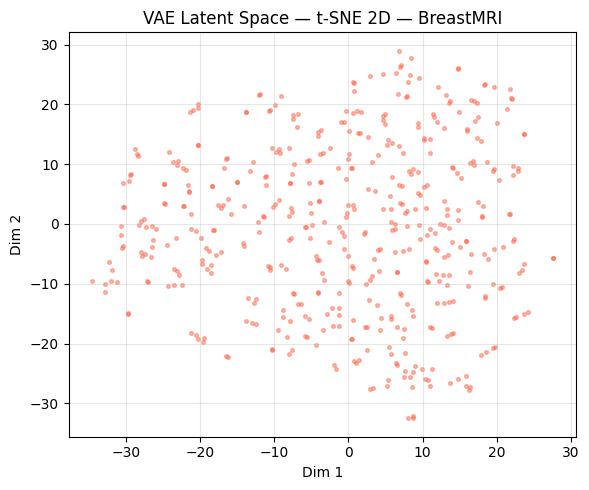

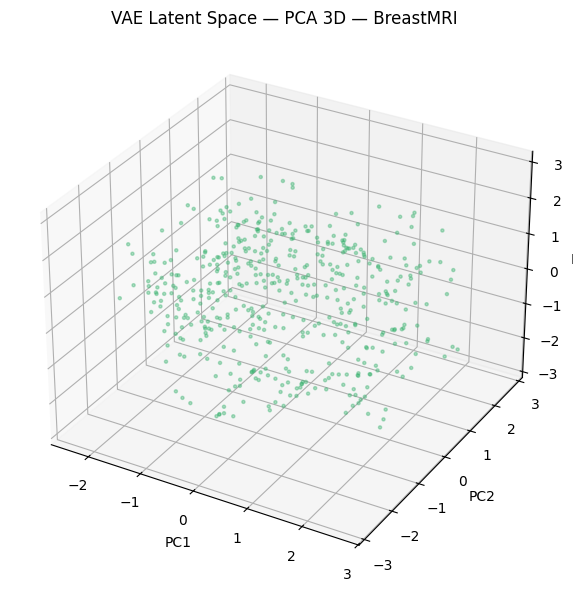

In [35]:
z_vae_BreastMRI = get_vae_latents(vae_BreastMRI, val_ds_BreastMRI)
plot_pca_2d(z_vae_BreastMRI,  'VAE', 'BreastMRI')
plot_tsne_2d(z_vae_BreastMRI, 'VAE', 'BreastMRI')
plot_pca_3d(z_vae_BreastMRI,  'VAE', 'BreastMRI')

---
## Region: CXR
All cells below train and evaluate independent AE and VAE models using only `CXR` images.

### CXR — Data Pipeline

In [36]:
train_ds_CXR, val_ds_CXR = build_dataset('CXR')

CXR: 10000 images found


### CXR — Autoencoder (AE)

In [37]:
ae_CXR, ae_hist_CXR = train_ae('CXR', train_ds_CXR, val_ds_CXR)

Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0492 - val_loss: 0.0122 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0102 - val_loss: 0.0072 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0066 - val_loss: 0.0058 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0054 - val_loss: 0.0051 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0048 - val_loss: 0.0047 - learning_rate: 0.0010
Epoch 6/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0044 - val_loss: 0.0044 - learning_rate: 0.0010
Epoch 7/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0041 - val_loss: 0.0042 - learning_rate: 0.0010
Epoch 8/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0039 - val_loss: 0.0041 - learning_rate: 0.0010
Epoch 9/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0037 - val_loss: 0.0040 - learning_rate: 0.0010


#### CXR — AE Loss Curves

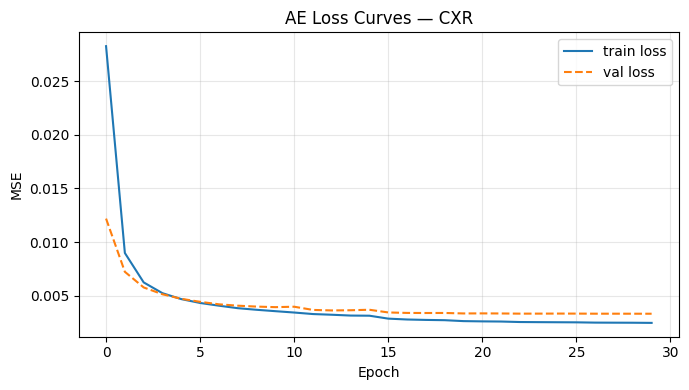

In [38]:
plot_ae_loss(ae_hist_CXR, 'CXR')

#### CXR — AE Reconstructions

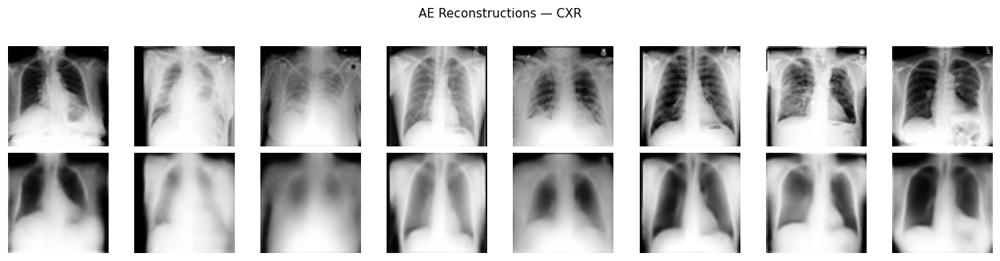

In [39]:
plot_reconstructions(ae_CXR, val_ds_CXR, 'AE', 'CXR')

#### CXR — AE Denoising

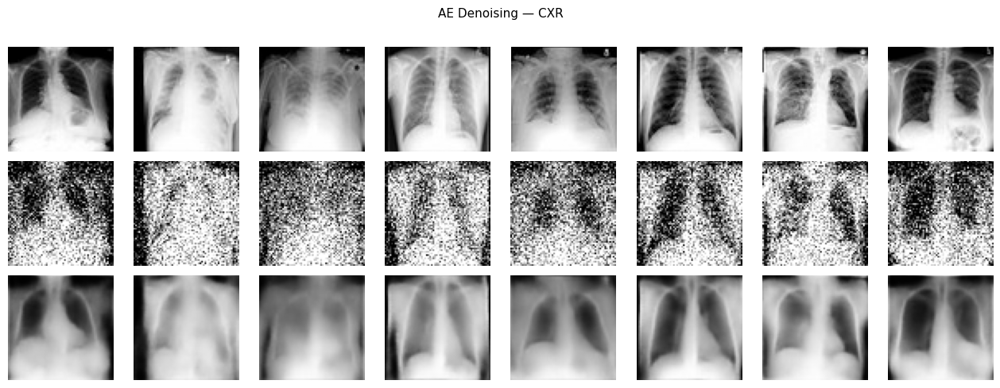

In [40]:
plot_denoising(ae_CXR, val_ds_CXR, 'AE', 'CXR')

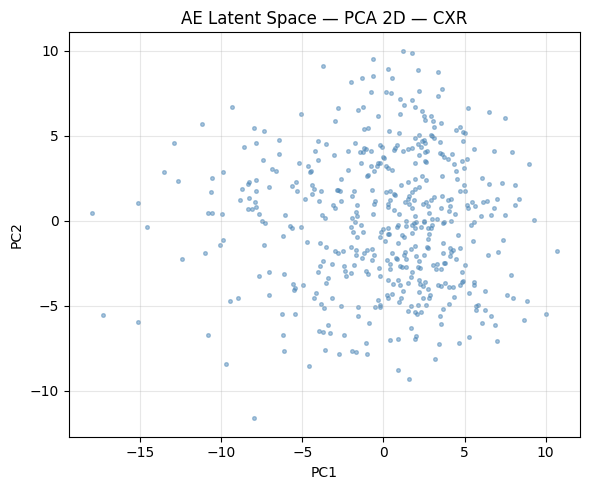

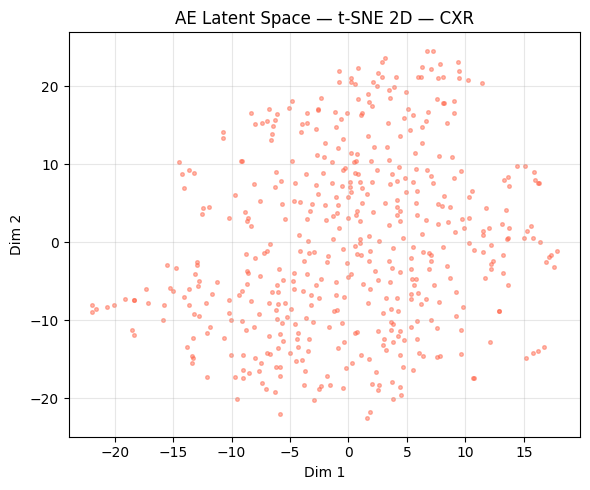

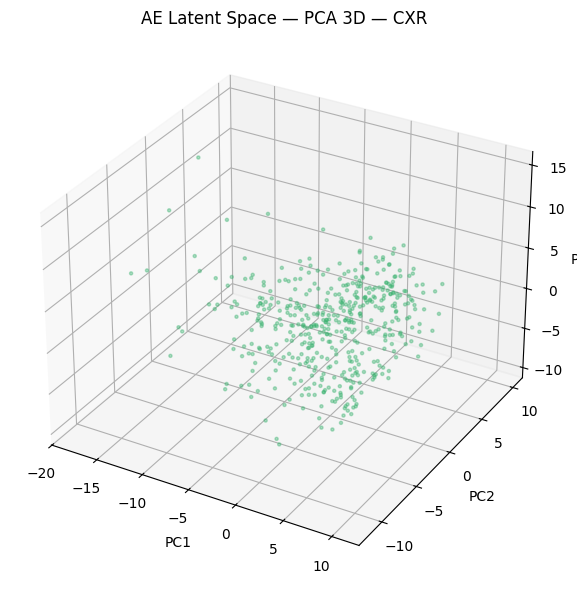

In [41]:
z_ae_CXR = get_ae_latents(ae_CXR, val_ds_CXR)
plot_pca_2d(z_ae_CXR,  'AE', 'CXR')
plot_tsne_2d(z_ae_CXR, 'AE', 'CXR')
plot_pca_3d(z_ae_CXR,  'AE', 'CXR')

### CXR — Variational Autoencoder (VAE)

In [42]:
train_ds_CXR, val_ds_CXR = build_dataset('CXR')
vae_CXR, vae_hist_CXR = train_vae('CXR', train_ds_CXR, val_ds_CXR)

CXR: 10000 images found
Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - kl_loss: 9.1378 - recon_loss: 229.7356 - total_loss: 238.8734 - val_kl_loss: 20.1562 - val_recon_loss: 80.4616 - val_total_loss: 100.6179 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 20.3794 - recon_loss: 73.5771 - total_loss: 93.9565 - val_kl_loss: 22.9503 - val_recon_loss: 61.5646 - val_total_loss: 84.5149 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 20.8113 - recon_loss: 59.6059 - total_loss: 80.4172 - val_kl_loss: 22.0329 - val_recon_loss: 53.2838 - val_total_loss: 75.3167 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 21.0819 - recon_loss: 52.0894 - total_loss: 73.1714 - val_kl_loss: 22.0696 - val_recon_loss: 47.9163 - val_total_loss: 69.9858 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 21.5787 - recon_loss: 47.5349 - total_loss: 69.11

#### CXR — VAE Loss Curves

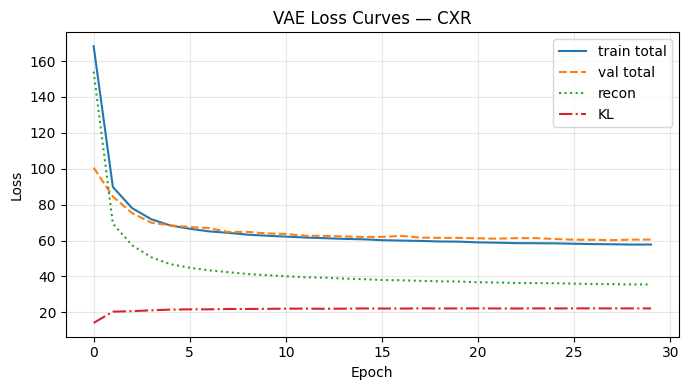

In [43]:
plot_vae_loss(vae_hist_CXR, 'CXR')

#### CXR — VAE Reconstructions

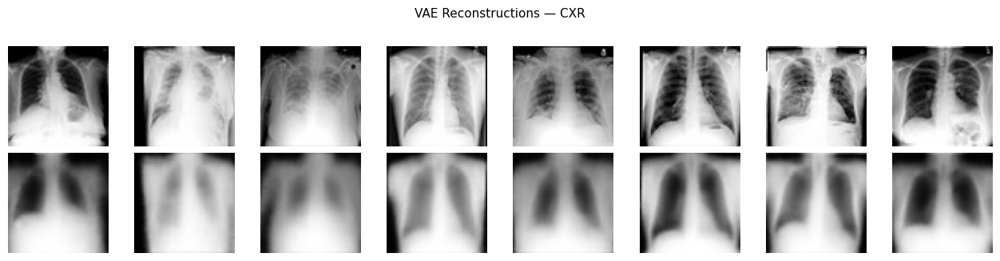

In [44]:
plot_reconstructions(vae_CXR, val_ds_CXR, 'VAE', 'CXR')

#### CXR — VAE Latent Space (latent_dim=2)

CXR: 10000 images found
Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - kl_loss: 2.9478 - recon_loss: 240.3819 - total_loss: 243.3297 - val_kl_loss: 4.6691 - val_recon_loss: 130.9664 - val_total_loss: 135.6356 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.4954 - recon_loss: 129.4050 - total_loss: 133.9005 - val_kl_loss: 4.1841 - val_recon_loss: 122.9231 - val_total_loss: 127.1072 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 4.6317 - recon_loss: 124.4927 - total_loss: 129.1245 - val_kl_loss: 4.5536 - val_recon_loss: 120.5633 - val_total_loss: 125.1169 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.7312 - recon_loss: 121.6234 - total_loss: 126.3546 - val_kl_loss: 4.4429 - val_recon_loss: 121.3657 - val_total_loss: 125.8085 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - kl_loss: 4.8057 - recon_loss: 120.7192 - total_loss:

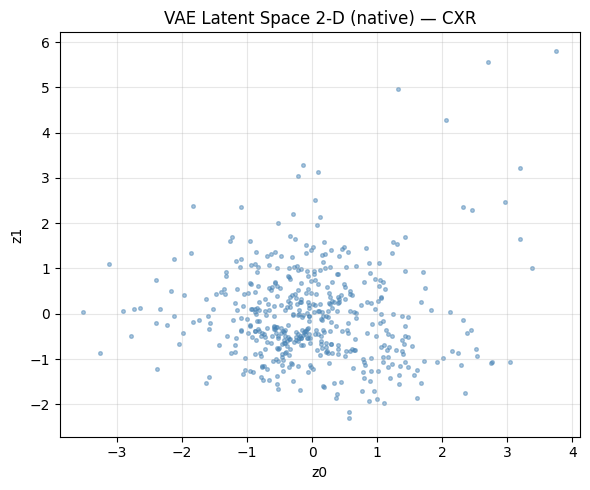

In [45]:
train_ds_CXR_2d, val_ds_CXR_2d = build_dataset('CXR')
vae_CXR_2d, _ = train_vae('CXR_2D', train_ds_CXR_2d, val_ds_CXR_2d, latent_dim=2)
plot_latent_space(vae_CXR_2d, val_ds_CXR_2d, 'CXR')

#### CXR — VAE Generated Samples

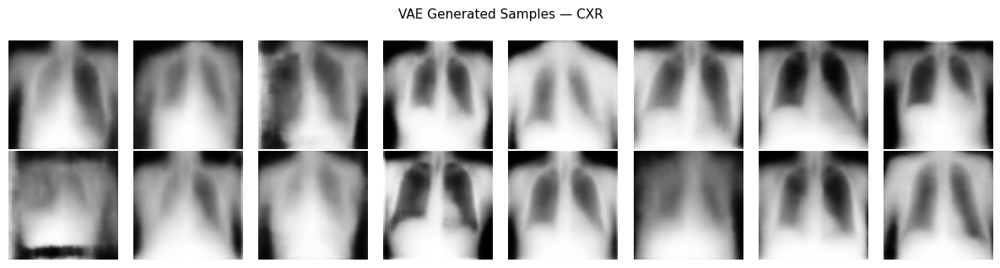

In [46]:
plot_generated(vae_CXR, 'CXR')

#### CXR — VAE Denoising

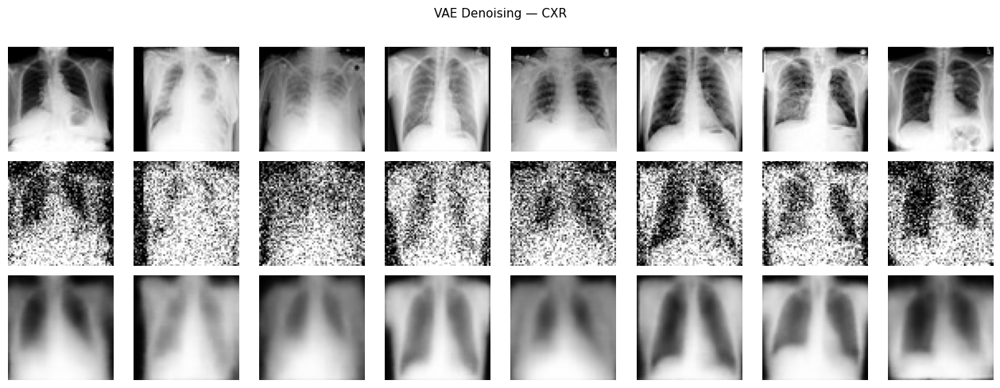

In [47]:
plot_denoising(vae_CXR, val_ds_CXR, 'VAE', 'CXR')

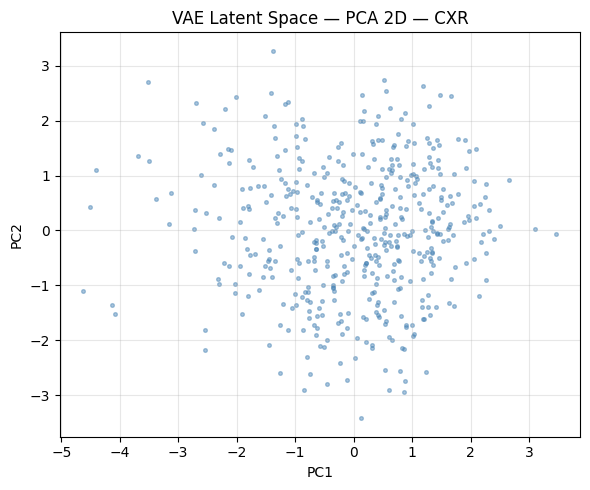

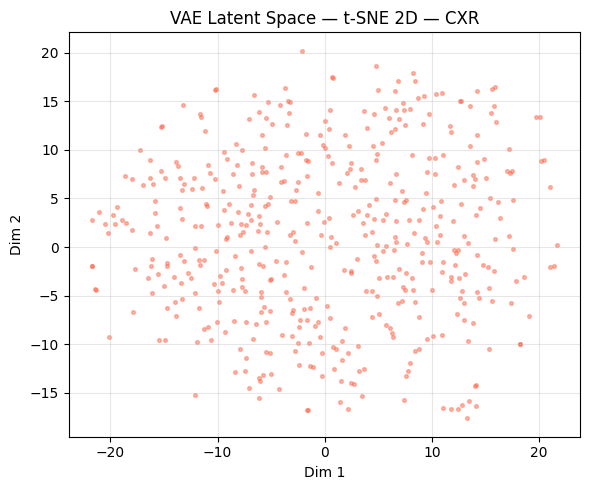

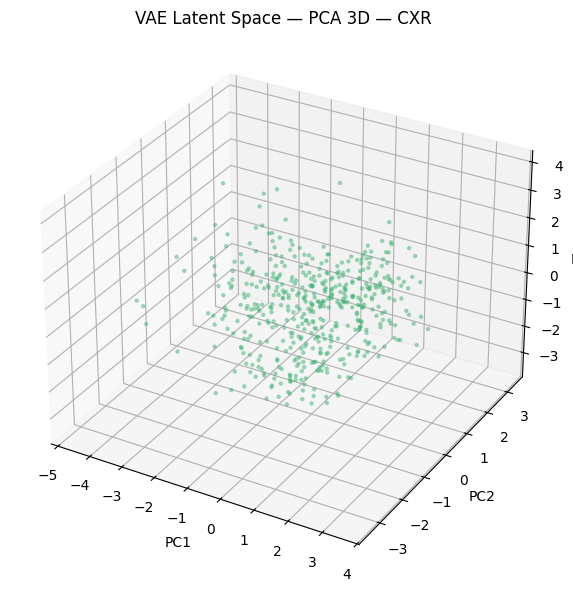

In [48]:
z_vae_CXR = get_vae_latents(vae_CXR, val_ds_CXR)
plot_pca_2d(z_vae_CXR,  'VAE', 'CXR')
plot_tsne_2d(z_vae_CXR, 'VAE', 'CXR')
plot_pca_3d(z_vae_CXR,  'VAE', 'CXR')

---
## Region: ChestCT
All cells below train and evaluate independent AE and VAE models using only `ChestCT` images.

### ChestCT — Data Pipeline

In [49]:
train_ds_ChestCT, val_ds_ChestCT = build_dataset('ChestCT')

ChestCT: 10000 images found


### ChestCT — Autoencoder (AE)

In [50]:
ae_ChestCT, ae_hist_ChestCT = train_ae('ChestCT', train_ds_ChestCT, val_ds_ChestCT)

Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.0035 - val_loss: 0.0032 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0030 - val_loss: 0.0026 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0025 - val_loss: 0.0023 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0022 - val_loss: 0.0021 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0021 - val_loss: 0.0020 - learning_rate: 0.0010
Epoch 6/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0019 - val_loss: 0.0019 - learning_rate: 0.0010
Epoch 7/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0018 - val_loss: 0.0019 - learning_rate: 0.0010
Epoch 8/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0018 - val_loss: 0.0018 - learning_rate: 0.0010
Epoch 9/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0017 - val_loss: 0.0018 - learning_rate: 0.0010


#### ChestCT — AE Loss Curves

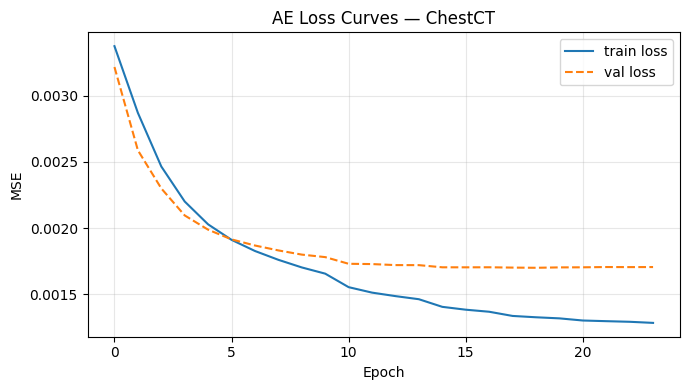

In [51]:
plot_ae_loss(ae_hist_ChestCT, 'ChestCT')

#### ChestCT — AE Reconstructions

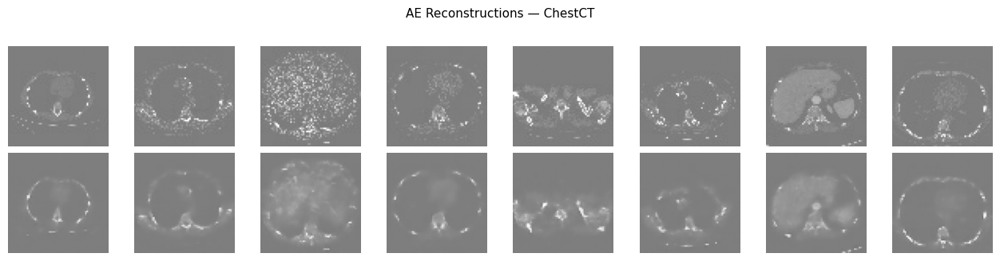

In [52]:
plot_reconstructions(ae_ChestCT, val_ds_ChestCT, 'AE', 'ChestCT')

#### ChestCT — AE Denoising

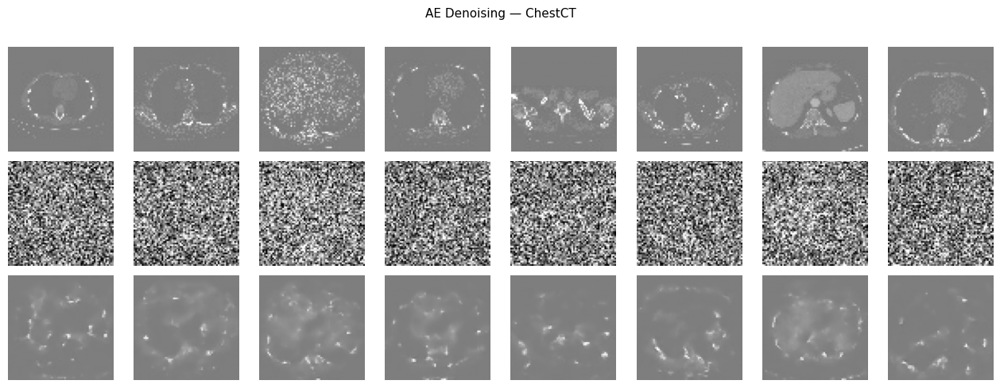

In [53]:
plot_denoising(ae_ChestCT, val_ds_ChestCT, 'AE', 'ChestCT')

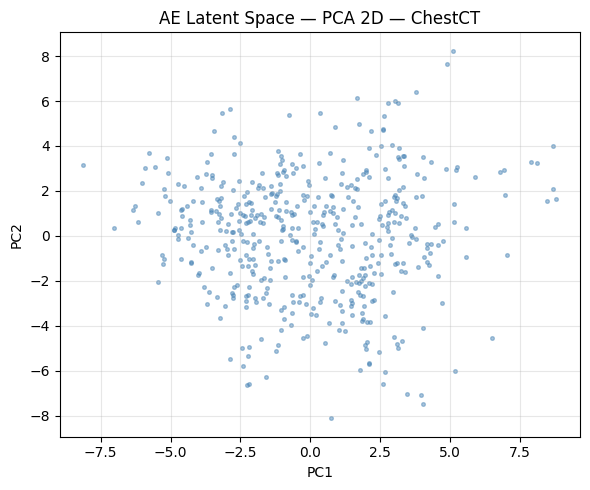

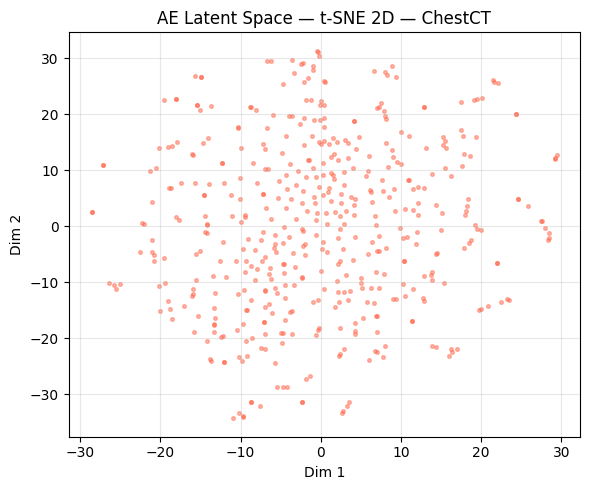

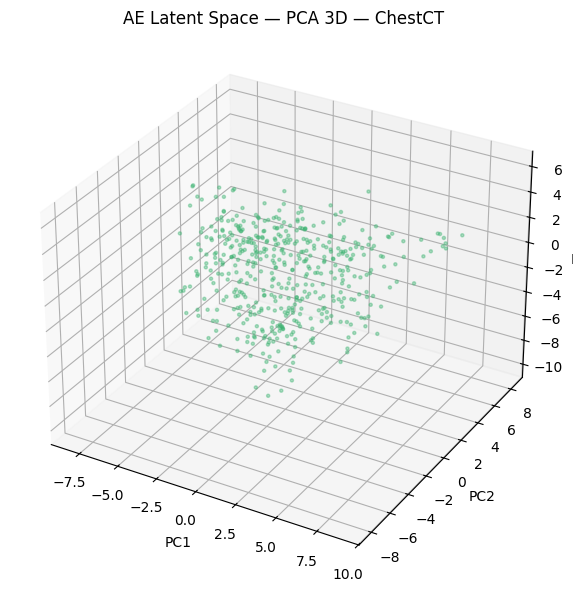

In [54]:
z_ae_ChestCT = get_ae_latents(ae_ChestCT, val_ds_ChestCT)
plot_pca_2d(z_ae_ChestCT,  'AE', 'ChestCT')
plot_tsne_2d(z_ae_ChestCT, 'AE', 'ChestCT')
plot_pca_3d(z_ae_ChestCT,  'AE', 'ChestCT')

### ChestCT — Variational Autoencoder (VAE)

In [55]:
train_ds_ChestCT, val_ds_ChestCT = build_dataset('ChestCT')
vae_ChestCT, vae_hist_ChestCT = train_vae('ChestCT', train_ds_ChestCT, val_ds_ChestCT)

ChestCT: 10000 images found
Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - kl_loss: 0.0046 - recon_loss: 13.9415 - total_loss: 13.9461 - val_kl_loss: 1.7893e-04 - val_recon_loss: 13.3897 - val_total_loss: 13.3899 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 3.0248e-04 - recon_loss: 13.4818 - total_loss: 13.4821 - val_kl_loss: 0.0021 - val_recon_loss: 13.3559 - val_total_loss: 13.3580 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 3.2971e-04 - recon_loss: 13.4508 - total_loss: 13.4511 - val_kl_loss: 1.3949e-04 - val_recon_loss: 13.3472 - val_total_loss: 13.3473 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 6.5157e-04 - recon_loss: 13.4297 - total_loss: 13.4304 - val_kl_loss: 1.1479e-04 - val_recon_loss: 13.3571 - val_total_loss: 13.3572 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 2.7012e-04 - recon_loss: 13.477

#### ChestCT — VAE Loss Curves

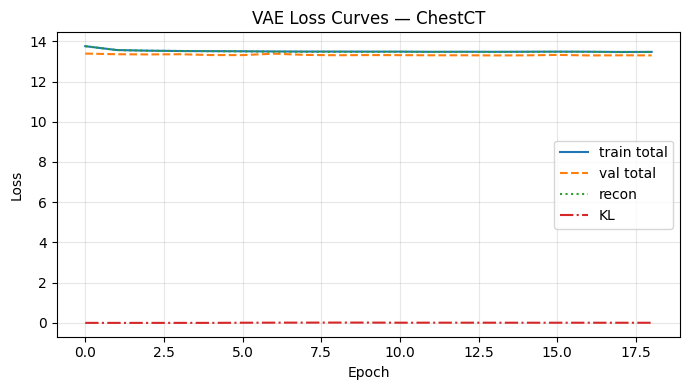

In [56]:
plot_vae_loss(vae_hist_ChestCT, 'ChestCT')

#### ChestCT — VAE Reconstructions

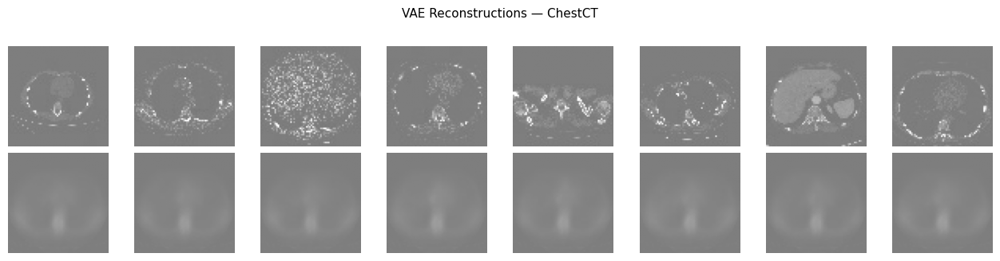

In [57]:
plot_reconstructions(vae_ChestCT, val_ds_ChestCT, 'VAE', 'ChestCT')

#### ChestCT — VAE Latent Space (latent_dim=2)

ChestCT: 10000 images found
Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - kl_loss: 0.0012 - recon_loss: 13.8600 - total_loss: 13.8612 - val_kl_loss: 7.8861e-05 - val_recon_loss: 13.3219 - val_total_loss: 13.3220 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 5.7612e-05 - recon_loss: 13.4126 - total_loss: 13.4126 - val_kl_loss: 2.9904e-05 - val_recon_loss: 13.3030 - val_total_loss: 13.3030 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 2.7196e-05 - recon_loss: 13.4096 - total_loss: 13.4096 - val_kl_loss: 2.0657e-05 - val_recon_loss: 13.3027 - val_total_loss: 13.3028 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - kl_loss: 2.5203e-05 - recon_loss: 13.3914 - total_loss: 13.3914 - val_kl_loss: 1.5378e-05 - val_recon_loss: 13.3322 - val_total_loss: 13.3322 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 1.3768e-05 - recon_loss: 13

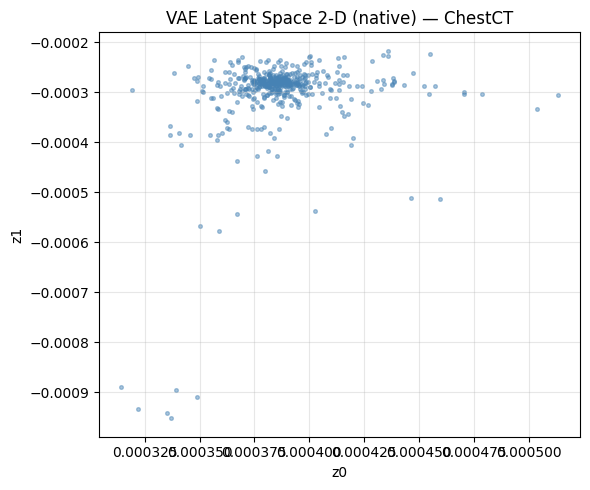

In [58]:
train_ds_ChestCT_2d, val_ds_ChestCT_2d = build_dataset('ChestCT')
vae_ChestCT_2d, _ = train_vae('ChestCT_2D', train_ds_ChestCT_2d, val_ds_ChestCT_2d, latent_dim=2)
plot_latent_space(vae_ChestCT_2d, val_ds_ChestCT_2d, 'ChestCT')

#### ChestCT — VAE Generated Samples

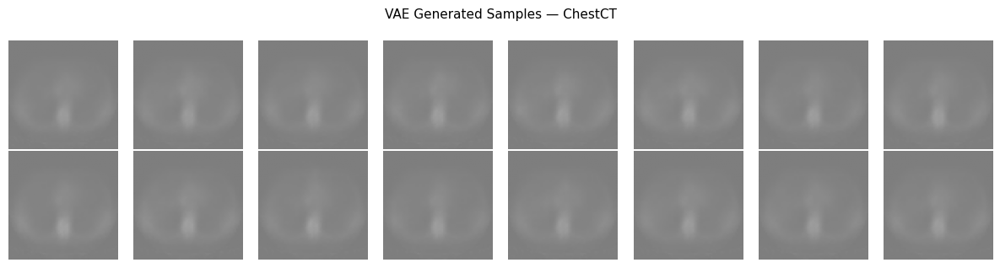

In [59]:
plot_generated(vae_ChestCT, 'ChestCT')

#### ChestCT — VAE Denoising

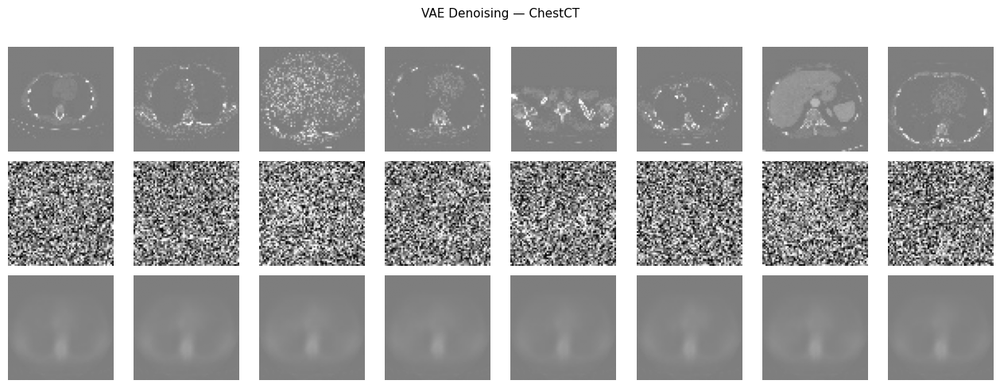

In [60]:
plot_denoising(vae_ChestCT, val_ds_ChestCT, 'VAE', 'ChestCT')

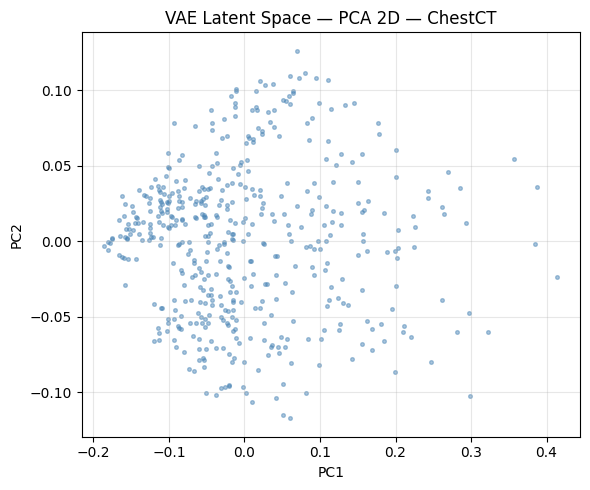

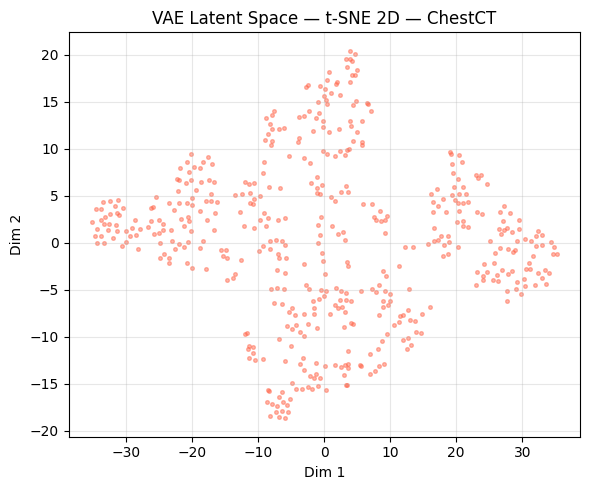

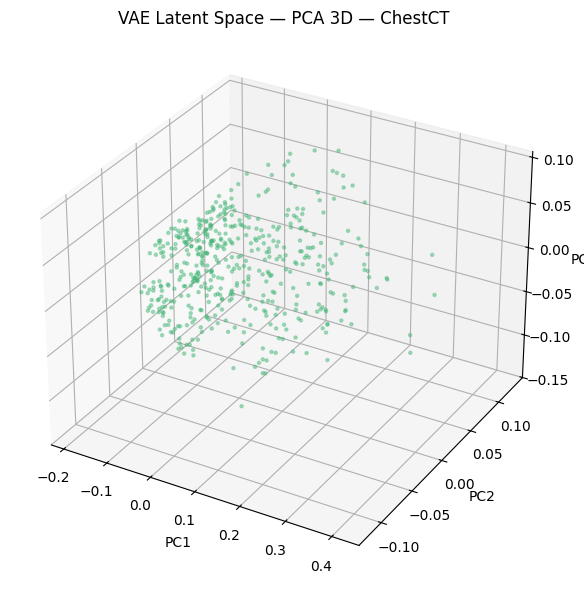

In [61]:
z_vae_ChestCT = get_vae_latents(vae_ChestCT, val_ds_ChestCT)
plot_pca_2d(z_vae_ChestCT,  'VAE', 'ChestCT')
plot_tsne_2d(z_vae_ChestCT, 'VAE', 'ChestCT')
plot_pca_3d(z_vae_ChestCT,  'VAE', 'ChestCT')

---
## Region: Hand
All cells below train and evaluate independent AE and VAE models using only `Hand` images.

### Hand — Data Pipeline

In [62]:
train_ds_Hand, val_ds_Hand = build_dataset('Hand')

Hand: 10000 images found


### Hand — Autoencoder (AE)

In [63]:
ae_Hand, ae_hist_Hand = train_ae('Hand', train_ds_Hand, val_ds_Hand)

Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.0598 - val_loss: 0.0145 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0124 - val_loss: 0.0086 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0076 - val_loss: 0.0062 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0058 - val_loss: 0.0052 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0048 - val_loss: 0.0047 - learning_rate: 0.0010
Epoch 6/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0043 - val_loss: 0.0042 - learning_rate: 0.0010
Epoch 7/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0039 - val_loss: 0.0040 - learning_rate: 0.0010
Epoch 8/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0037 - val_loss: 0.0039 - learning_rate: 0.0010
Epoch 9/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0035 - val_loss: 0.0038 - learning_rate: 0.0010


#### Hand — AE Loss Curves

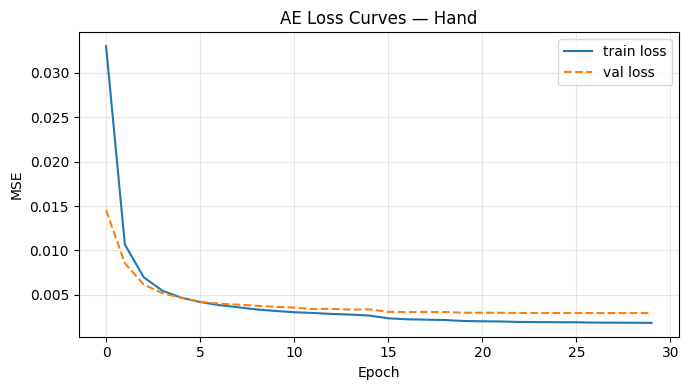

In [64]:
plot_ae_loss(ae_hist_Hand, 'Hand')

#### Hand — AE Reconstructions

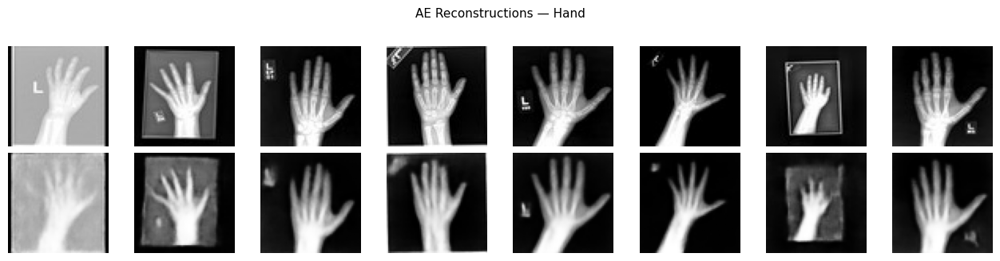

In [65]:
plot_reconstructions(ae_Hand, val_ds_Hand, 'AE', 'Hand')

#### Hand — AE Denoising

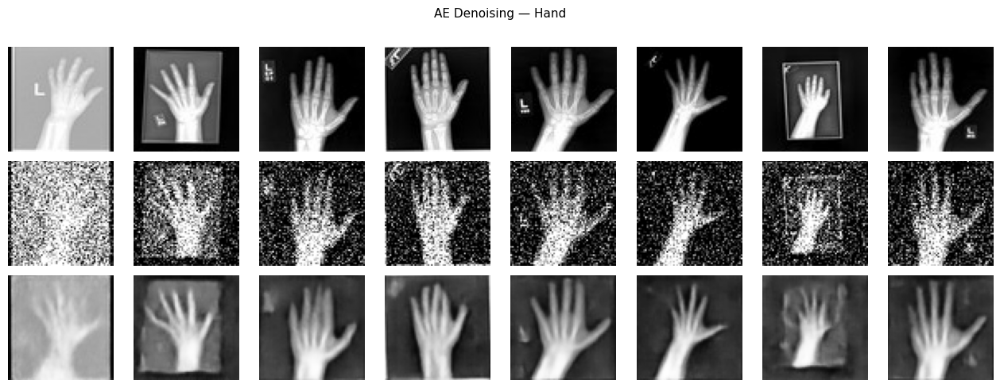

In [66]:
plot_denoising(ae_Hand, val_ds_Hand, 'AE', 'Hand')

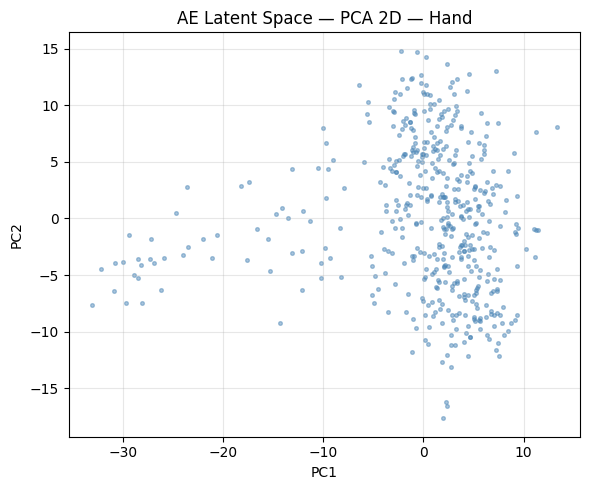

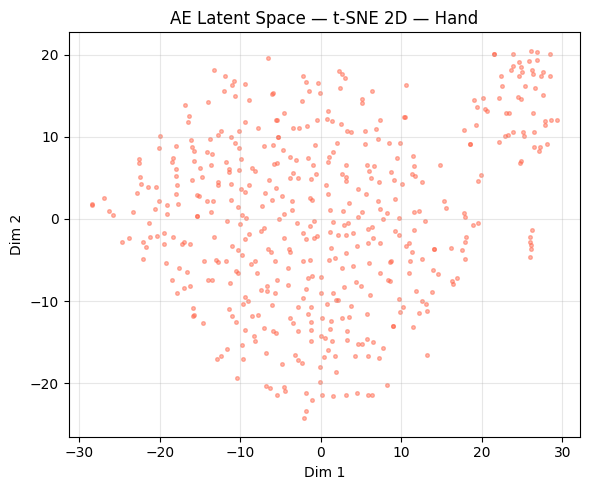

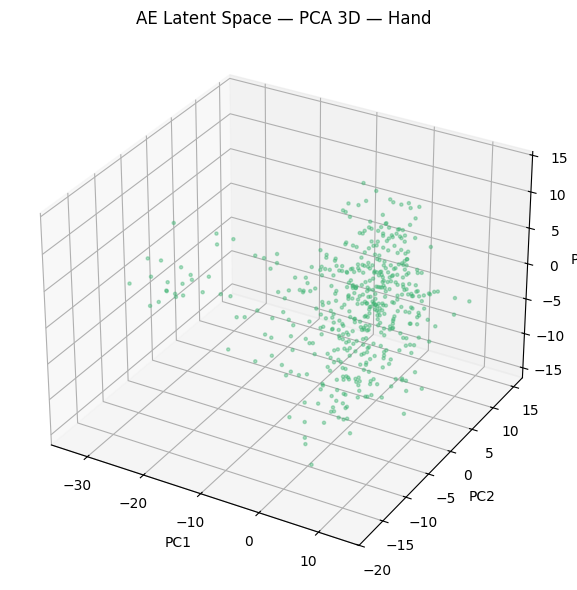

In [67]:
z_ae_Hand = get_ae_latents(ae_Hand, val_ds_Hand)
plot_pca_2d(z_ae_Hand,  'AE', 'Hand')
plot_tsne_2d(z_ae_Hand, 'AE', 'Hand')
plot_pca_3d(z_ae_Hand,  'AE', 'Hand')

### Hand — Variational Autoencoder (VAE)

In [68]:
train_ds_Hand, val_ds_Hand = build_dataset('Hand')
vae_Hand, vae_hist_Hand = train_vae('Hand', train_ds_Hand, val_ds_Hand)

Hand: 10000 images found
Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - kl_loss: 8.8798 - recon_loss: 270.1661 - total_loss: 279.0460 - val_kl_loss: 12.2206 - val_recon_loss: 152.2243 - val_total_loss: 164.4449 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 15.4845 - recon_loss: 122.2045 - total_loss: 137.6889 - val_kl_loss: 18.2113 - val_recon_loss: 67.5066 - val_total_loss: 85.7179 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 19.4792 - recon_loss: 63.7956 - total_loss: 83.2748 - val_kl_loss: 20.6101 - val_recon_loss: 57.4076 - val_total_loss: 78.0177 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 20.7089 - recon_loss: 55.1462 - total_loss: 75.8551 - val_kl_loss: 19.3067 - val_recon_loss: 53.0982 - val_total_loss: 72.4049 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - kl_loss: 20.9338 - recon_loss: 50.3576 - total_loss: 7

#### Hand — VAE Loss Curves

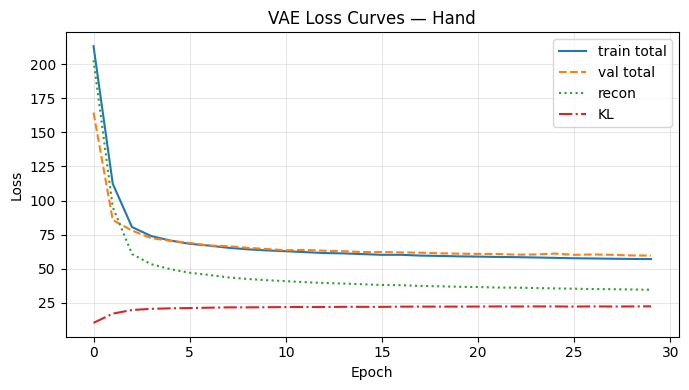

In [69]:
plot_vae_loss(vae_hist_Hand, 'Hand')

#### Hand — VAE Reconstructions

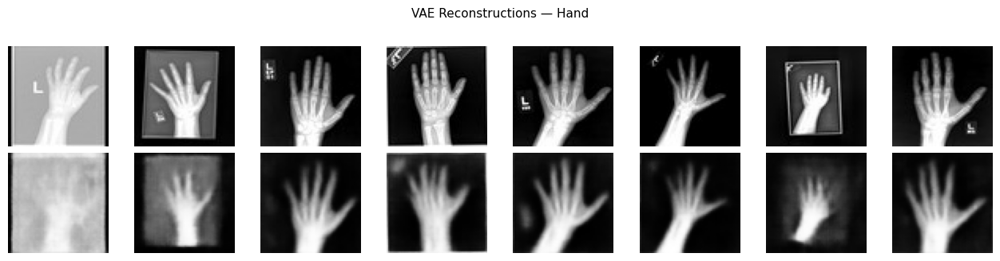

In [70]:
plot_reconstructions(vae_Hand, val_ds_Hand, 'VAE', 'Hand')

#### Hand — VAE Latent Space (latent_dim=2)

Hand: 10000 images found
Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - kl_loss: 4.5071 - recon_loss: 286.9960 - total_loss: 291.5031 - val_kl_loss: 4.4011 - val_recon_loss: 171.5733 - val_total_loss: 175.9744 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.5026 - recon_loss: 143.7319 - total_loss: 148.2344 - val_kl_loss: 4.3528 - val_recon_loss: 113.5426 - val_total_loss: 117.8953 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.7392 - recon_loss: 111.9652 - total_loss: 116.7044 - val_kl_loss: 4.8461 - val_recon_loss: 109.9436 - val_total_loss: 114.7897 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.8504 - recon_loss: 108.8225 - total_loss: 113.6730 - val_kl_loss: 4.4630 - val_recon_loss: 108.7666 - val_total_loss: 113.2296 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.9323 - recon_loss: 106.7555 - total_loss

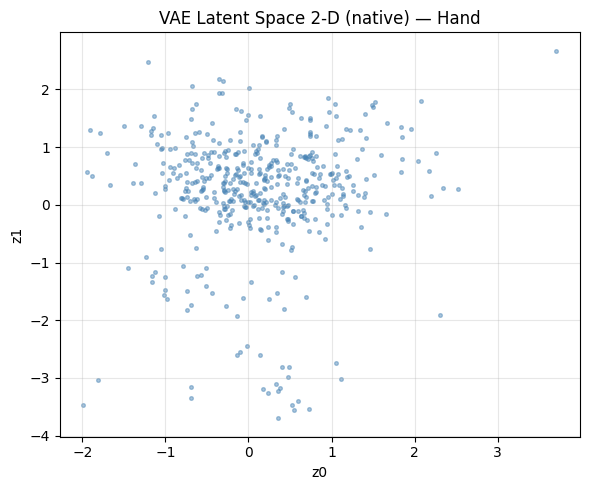

In [71]:
train_ds_Hand_2d, val_ds_Hand_2d = build_dataset('Hand')
vae_Hand_2d, _ = train_vae('Hand_2D', train_ds_Hand_2d, val_ds_Hand_2d, latent_dim=2)
plot_latent_space(vae_Hand_2d, val_ds_Hand_2d, 'Hand')

#### Hand — VAE Generated Samples

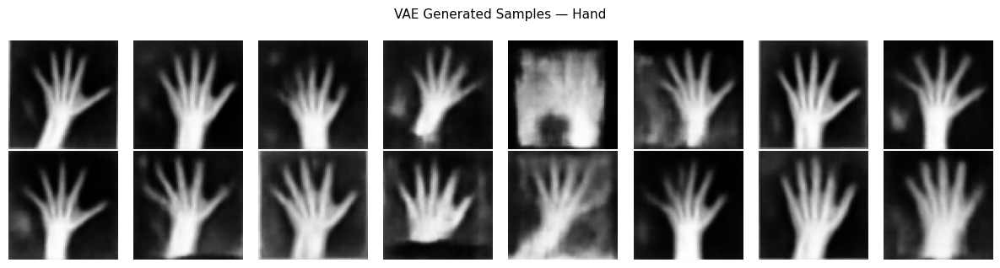

In [72]:
plot_generated(vae_Hand, 'Hand')

#### Hand — VAE Denoising

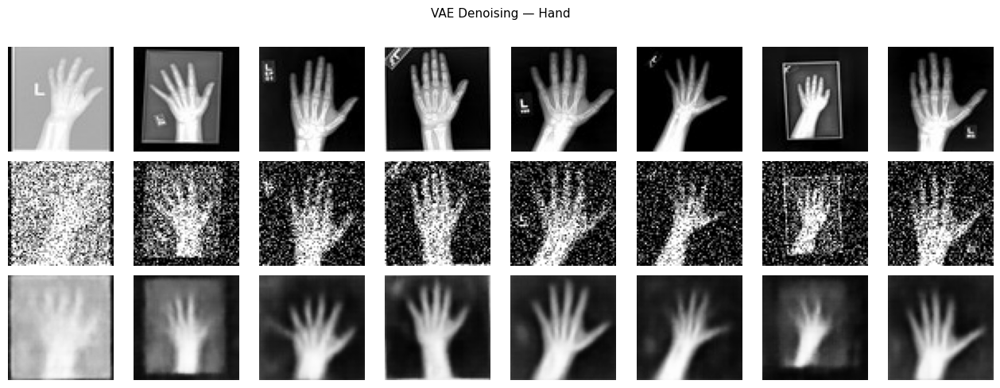

In [73]:
plot_denoising(vae_Hand, val_ds_Hand, 'VAE', 'Hand')

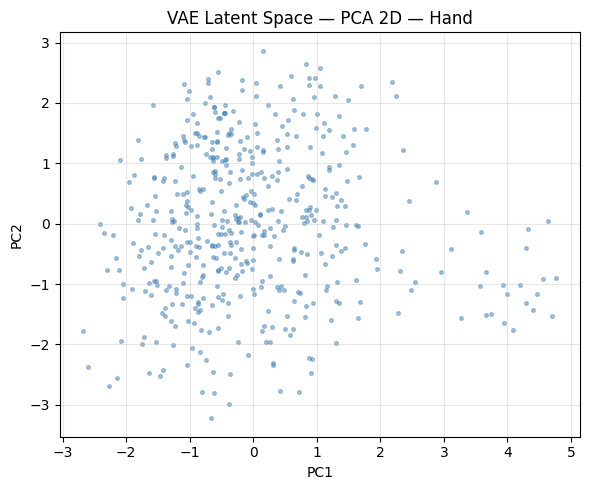

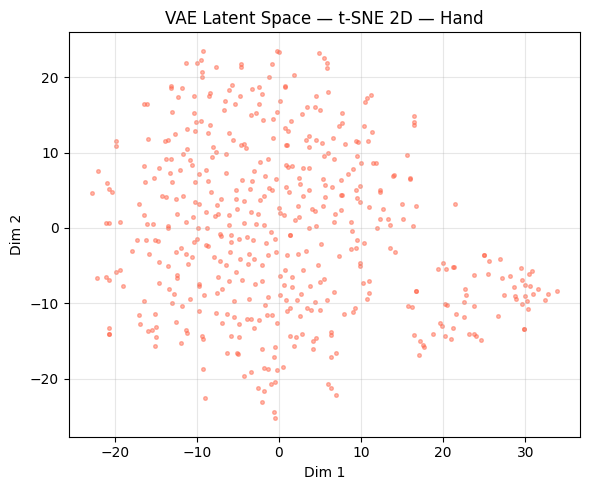

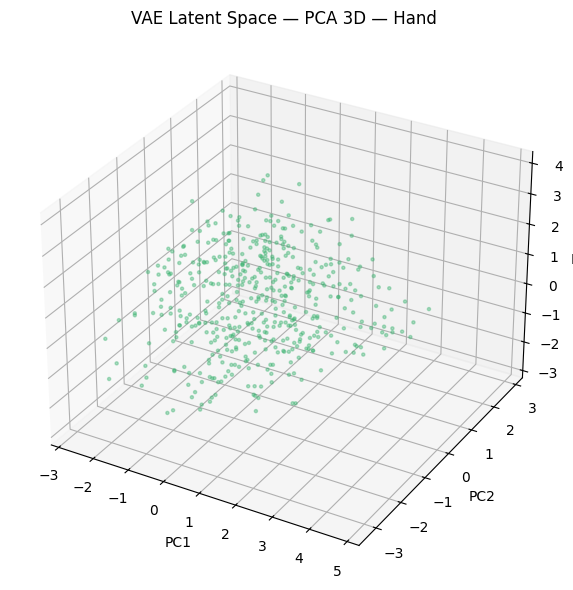

In [74]:
z_vae_Hand = get_vae_latents(vae_Hand, val_ds_Hand)
plot_pca_2d(z_vae_Hand,  'VAE', 'Hand')
plot_tsne_2d(z_vae_Hand, 'VAE', 'Hand')
plot_pca_3d(z_vae_Hand,  'VAE', 'Hand')

---
## Region: HeadCT
All cells below train and evaluate independent AE and VAE models using only `HeadCT` images.

### HeadCT — Data Pipeline

In [75]:
train_ds_HeadCT, val_ds_HeadCT = build_dataset('HeadCT')

HeadCT: 10000 images found


### HeadCT — Autoencoder (AE)

In [76]:
ae_HeadCT, ae_hist_HeadCT = train_ae('HeadCT', train_ds_HeadCT, val_ds_HeadCT)

Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.0561 - val_loss: 0.0166 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0146 - val_loss: 0.0113 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0108 - val_loss: 0.0094 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0089 - val_loss: 0.0082 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0078 - val_loss: 0.0074 - learning_rate: 0.0010
Epoch 6/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0070 - val_loss: 0.0068 - learning_rate: 0.0010
Epoch 7/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0065 - val_loss: 0.0064 - learning_rate: 0.0010
Epoch 8/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0061 - val_loss: 0.0063 - learning_rate: 0.0010
Epoch 9/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0058 - val_loss: 0.0059 - learning_rate: 0.0010


#### HeadCT — AE Loss Curves

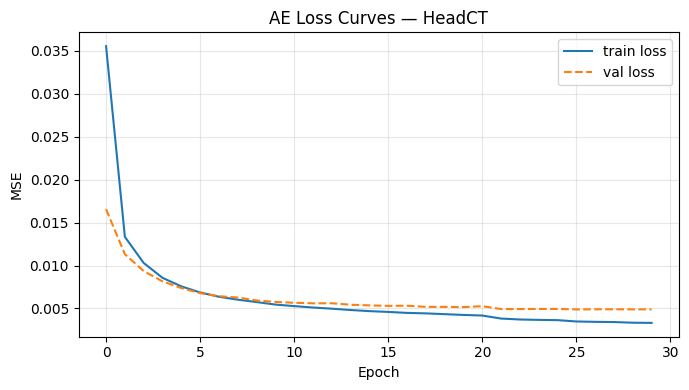

In [77]:
plot_ae_loss(ae_hist_HeadCT, 'HeadCT')

#### HeadCT — AE Reconstructions

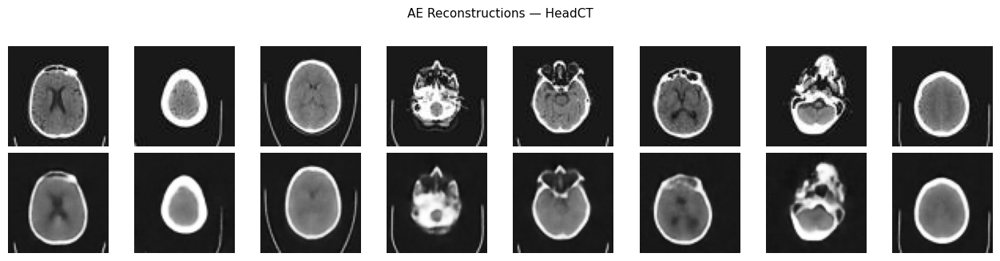

In [78]:
plot_reconstructions(ae_HeadCT, val_ds_HeadCT, 'AE', 'HeadCT')

#### HeadCT — AE Denoising

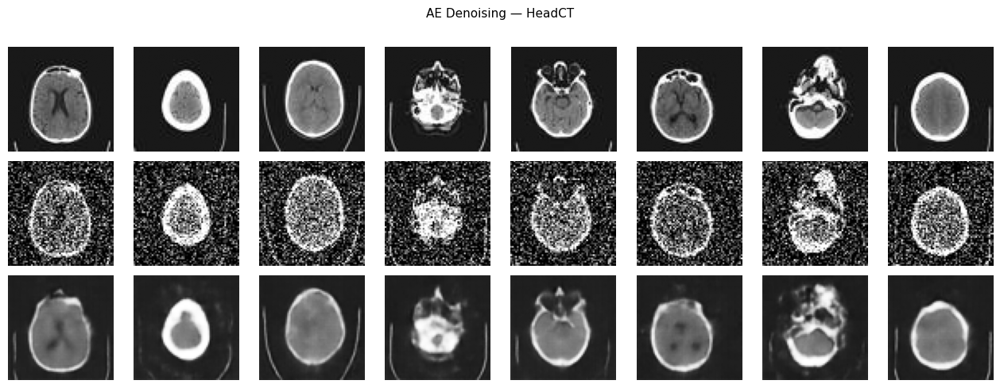

In [79]:
plot_denoising(ae_HeadCT, val_ds_HeadCT, 'AE', 'HeadCT')

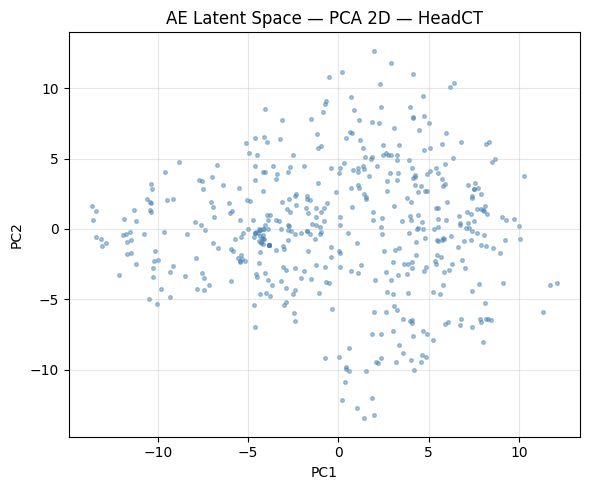

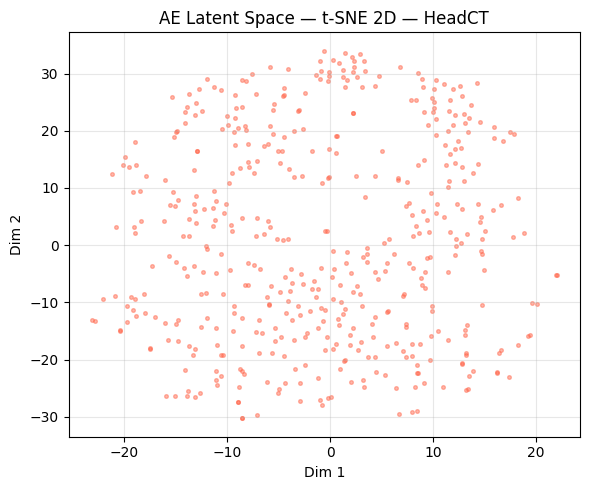

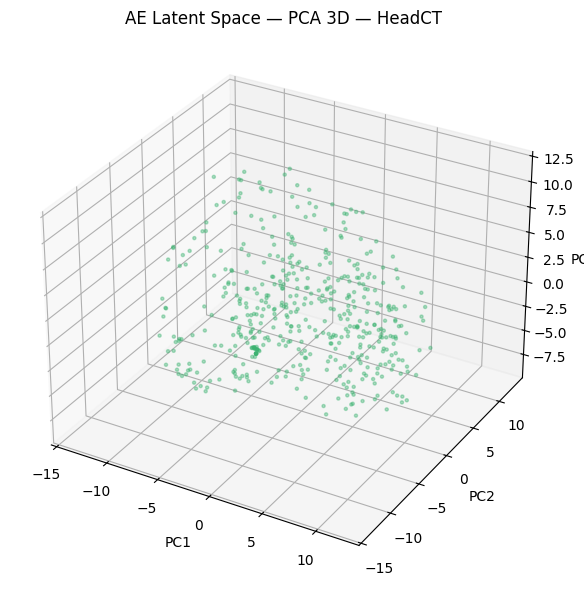

In [80]:
z_ae_HeadCT = get_ae_latents(ae_HeadCT, val_ds_HeadCT)
plot_pca_2d(z_ae_HeadCT,  'AE', 'HeadCT')
plot_tsne_2d(z_ae_HeadCT, 'AE', 'HeadCT')
plot_pca_3d(z_ae_HeadCT,  'AE', 'HeadCT')

### HeadCT — Variational Autoencoder (VAE)

In [81]:
train_ds_HeadCT, val_ds_HeadCT = build_dataset('HeadCT')
vae_HeadCT, vae_hist_HeadCT = train_vae('HeadCT', train_ds_HeadCT, val_ds_HeadCT)

HeadCT: 10000 images found
Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - kl_loss: 6.6484 - recon_loss: 209.0831 - total_loss: 215.7315 - val_kl_loss: 8.9710 - val_recon_loss: 122.3203 - val_total_loss: 131.2912 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 11.4401 - recon_loss: 106.5433 - total_loss: 117.9833 - val_kl_loss: 15.7985 - val_recon_loss: 77.5132 - val_total_loss: 93.3116 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 16.6110 - recon_loss: 72.8799 - total_loss: 89.4909 - val_kl_loss: 17.4083 - val_recon_loss: 66.1485 - val_total_loss: 83.5568 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 17.0504 - recon_loss: 64.6124 - total_loss: 81.6628 - val_kl_loss: 16.4475 - val_recon_loss: 63.2152 - val_total_loss: 79.6627 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - kl_loss: 17.3968 - recon_loss: 60.8288 - total_loss: 

#### HeadCT — VAE Loss Curves

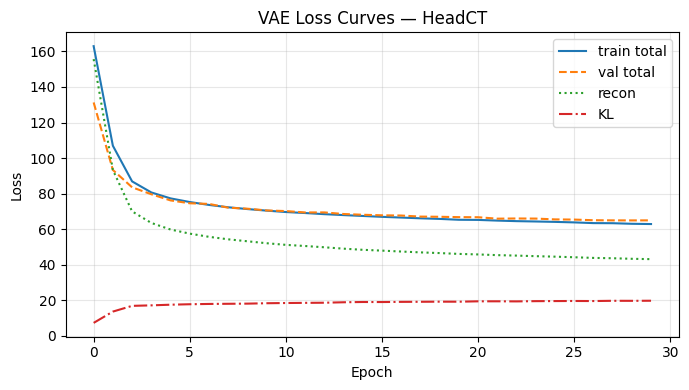

In [82]:
plot_vae_loss(vae_hist_HeadCT, 'HeadCT')

#### HeadCT — VAE Reconstructions

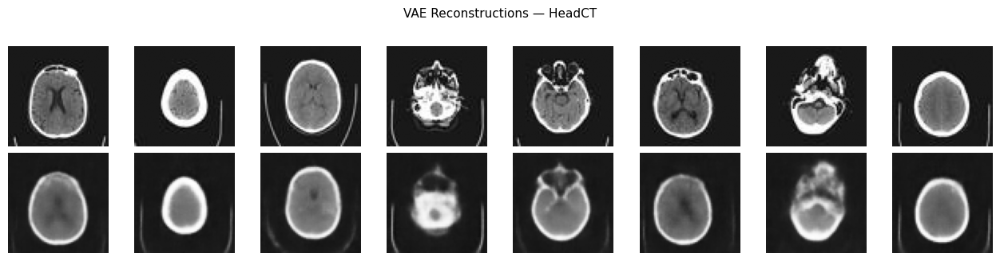

In [83]:
plot_reconstructions(vae_HeadCT, val_ds_HeadCT, 'VAE', 'HeadCT')

#### HeadCT — VAE Latent Space (latent_dim=2)

HeadCT: 10000 images found
Epoch 1/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - kl_loss: 2.7988 - recon_loss: 229.7331 - total_loss: 232.5319 - val_kl_loss: 3.6089 - val_recon_loss: 128.2619 - val_total_loss: 131.8709 - learning_rate: 0.0010
Epoch 2/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 3.8912 - recon_loss: 121.4435 - total_loss: 125.3347 - val_kl_loss: 4.6361 - val_recon_loss: 102.7844 - val_total_loss: 107.4205 - learning_rate: 0.0010
Epoch 3/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 4.9723 - recon_loss: 100.8398 - total_loss: 105.8121 - val_kl_loss: 5.4113 - val_recon_loss: 96.4706 - val_total_loss: 101.8820 - learning_rate: 0.0010
Epoch 4/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 5.2343 - recon_loss: 96.2714 - total_loss: 101.5057 - val_kl_loss: 5.1675 - val_recon_loss: 95.3010 - val_total_loss: 100.4685 - learning_rate: 0.0010
Epoch 5/30
266/266 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - kl_loss: 5.3459 - recon_loss: 94.5006 - total_loss: 

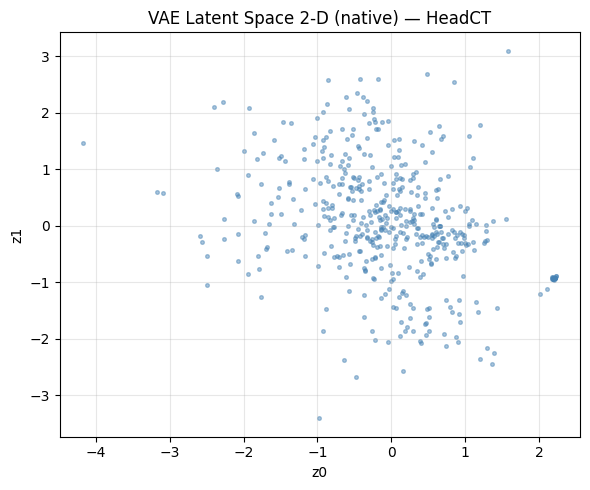

In [84]:
train_ds_HeadCT_2d, val_ds_HeadCT_2d = build_dataset('HeadCT')
vae_HeadCT_2d, _ = train_vae('HeadCT_2D', train_ds_HeadCT_2d, val_ds_HeadCT_2d, latent_dim=2)
plot_latent_space(vae_HeadCT_2d, val_ds_HeadCT_2d, 'HeadCT')

#### HeadCT — VAE Generated Samples

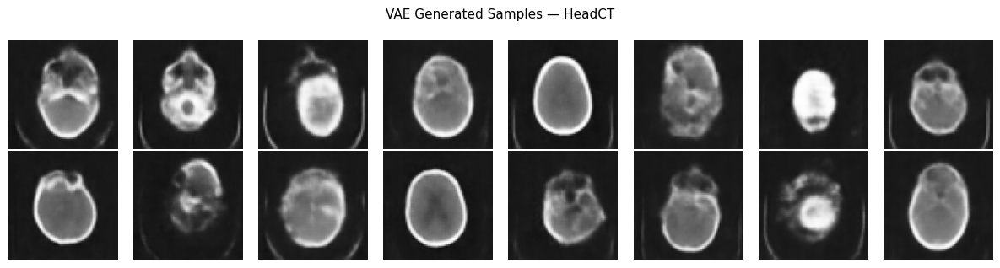

In [85]:
plot_generated(vae_HeadCT, 'HeadCT')

#### HeadCT — VAE Denoising

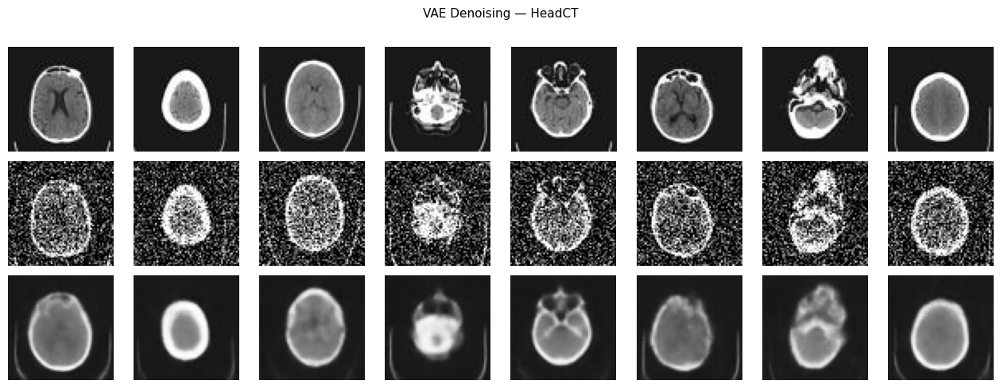

In [86]:
plot_denoising(vae_HeadCT, val_ds_HeadCT, 'VAE', 'HeadCT')

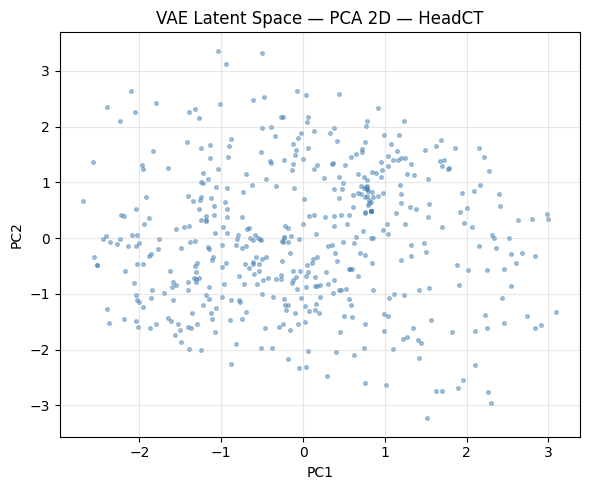

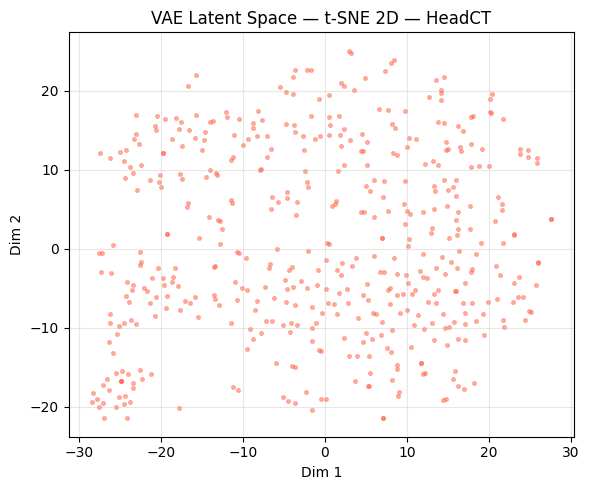

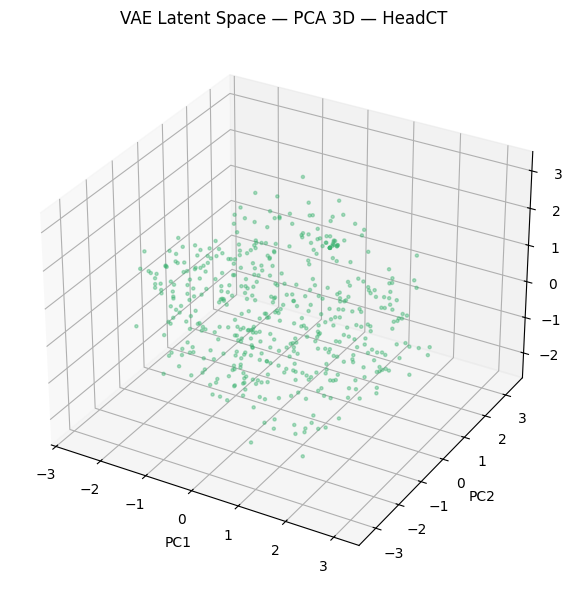

In [87]:
z_vae_HeadCT = get_vae_latents(vae_HeadCT, val_ds_HeadCT)
plot_pca_2d(z_vae_HeadCT,  'VAE', 'HeadCT')
plot_tsne_2d(z_vae_HeadCT, 'VAE', 'HeadCT')
plot_pca_3d(z_vae_HeadCT,  'VAE', 'HeadCT')

---
## Analysis: AE vs VAE on Medical MNIST

### Reconstruction
The **Autoencoder (AE)** maps each image to a single deterministic latent point, allowing it to minimise reconstruction error directly. This results in sharper outputs and a lower MSE val loss. The **Variational Autoencoder (VAE)** maps each image to a distribution `N(z_mean, exp(z_log_var))` and samples from it, which adds stochasticity that slightly blurs reconstructions — a trade-off for gaining a structured latent space.

### Latent Space Structure
In the AE, the latent space is **discontinuous and fragmented** — each image occupies an isolated point with no regularity between neighbours. In the VAE with `latent_dim=2`, the KL divergence term forces all encodings toward `N(0,I)`, producing a **smooth, continuous, and approximately circular** distribution. Nearby points in this space decode to semantically similar images.

### Generation
Because the AE has no structured prior, sampling `z ~ N(0,I)` and decoding produces noise. The VAE's KL regularisation ensures the latent space is aligned with the standard normal prior, so random samples decode into plausible new medical images.

### Denoising
Both models handle denoising via bottleneck compression. The VAE tends to produce smoother denoised outputs due to its probabilistic averaging over the latent distribution, while the AE may retain slightly more fine detail.

### Trade-offs
| Property | AE | VAE |
|---|---|---|
| Reconstruction sharpness | Higher | Slightly blurry |
| Latent space structure | Fragmented | Smooth and continuous |
| Generation ability | None | Sample from N(0,I) |
| Training stability | Simple MSE | KL balance needed |
| Denoising | Good | Good (smoother) |